# pip install and importing libraries

In [ ]:
# !pip install osmnx
# !pip install soundscapy
# !pip install geopandas
# !pip install matplotlib
# pip install ipykernel==5.5.6 ipython==7.34.0 pandas==1.5.3 'pyzmq<25'

In [1]:
# Add soundscapy to the Python path
# import sys
# sys.path.append('../..')
# imports
# %matplotlib inline
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
from scipy.stats import spearmanr
import osmnx as ox
from scipy import stats
import geopandas as gpd
import numpy as np



import warnings
# warnings.simplefilter('ignore')

%config InlineBackend.figure_format = 'svg'

# load the ssid dataset

In [25]:
filter_location = ['CamdenTown']

In [8]:
import soundscapy as sspy
ssid = sspy.isd.load_zenodo(version= "v0.2.2" )
# print(ssid)
ssid = sspy.isd.remove_lockdown(ssid)
ssid, excl = sspy.isd.validate(ssid, allow_paq_na=False)
ssid.tail()

C:\Users\n.smit\AppData\Local\Temp\ipykernel_21948\1591036225.py:4: PendingDeprecationWarning: Lockdown data no longer included in ISD past v1.0. This function will be deprecated in sspy v1.0
  ssid = sspy.isd.remove_lockdown(ssid)


Renaming PAQ columns.
Checking PAQ data quality.
Identified 56 samples to remove.
[95, 108, 124, 127, 146, 154, 160, 178, 186, 203, 220, 226, 255, 381, 404, 407, 431, 562, 571, 577, 586, 590, 606, 631, 659, 666, 675, 689, 694, 707, 729, 839, 846, 877, 897, 992, 1007, 1027, 1055, 1056, 1064, 1097, 1214, 1217, 1222, 1223, 1225, 1229, 1235, 1255, 1268, 1269, 1300, 1316, 1321, 1335]


,LocationID,SessionID,GroupID,RecordID,Language,Lockdown,start_time,end_time,latitude,longitude,...,"FS_Avg,arith(vacil)","I_HM_Avg,arith(iu)","Ton_HM_Avg,arith(tuHMS)",LZeq_L(dB(SPL)),LAeq_L(A)(dB(SPL)),LA10_LA90(dB(SPL)),LCeq_LAeq(dB(SPL)),LC10_LC90(dB(SPL)),RA_2D_cp(cPa),PA(Zwicker)
1862,TorringtonSq,TorringtonSq4,TS425,1275.0,English,0,2019-10-22 14:02:00,2019-10-22 14:07:00,51.5233,-0.1311,...,0.0375,0.391,0.336,70.83,67.11,6.89,3.25,5.51,13.6,31.166903
1863,TorringtonSq,TorringtonSq4,TS426,1279.0,English,0,2019-10-22 14:10:00,2019-10-22 14:16:00,51.5233,-0.1311,...,0.0425,0.415,0.262,73.79,69.48,9.84,3.85,9.24,14.0,38.629748
1864,TorringtonSq,TorringtonSq4,TS426,1278.0,English,0,2019-10-22 14:12:00,2019-10-22 14:16:00,51.5233,-0.1311,...,0.0425,0.415,0.262,73.79,69.48,9.84,3.85,9.24,14.0,38.629748
1866,TorringtonSq,TorringtonSq4,TS426,1280.0,English,0,2019-10-22 14:12:00,2019-10-22 14:16:00,51.5233,-0.1311,...,0.0425,0.415,0.262,73.79,69.48,9.84,3.85,9.24,14.0,38.629748
1867,TorringtonSq,TorringtonSq4,TS426,1282.0,English,0,2019-10-22 13:59:00,2019-10-22 14:18:00,51.5233,-0.1311,...,0.0425,0.415,0.262,73.79,69.48,9.84,3.85,9.24,14.0,38.629748


## remove outliers

In [9]:
# @title remove outliers
# Step 1: Group by identical latitude and longitude, and count the number of points in each group
len01 = len(ssid)
grouped_stats = ssid.groupby(['latitude', 'longitude']).size().reset_index(name='row_count')

# Step 2: Filter places with 5 or more points
places_with_5_or_more_points = grouped_stats[grouped_stats['row_count'] >= 3]

# Step 3: Iterate over each group and remove outliers in the 'ISOPleasan' column using the Z-score method
for index, group in places_with_5_or_more_points.iterrows():
    # Filter data for the current group
    group_data = ssid[(ssid['latitude'] == group['latitude']) &
                      (ssid['longitude'] == group['longitude'])]

    # Calculate z-scores for the 'ISOPleasan' column
    z_scores = np.abs((group_data['ISOPleasant'] - group_data['ISOPleasant'].mean()) / group_data['ISOPleasant'].std())

    # Define the threshold for outlier detection (z-score > 2)
    outlier_threshold = 2.0

    # Filter outliers based on the defined threshold
    outliers_to_remove = group_data[z_scores > outlier_threshold]

    # Print the outliers removed for this group
    # if not outliers_to_remove.empty:
        # print(f"Outliers removed for group at latitude {group['latitude']} and longitude {group['longitude']}:")
        # print(outliers_to_remove)

    # Remove outliers from the original DataFrame
    ssid = ssid.drop(outliers_to_remove.index)


# Now 'data_for_grouping' contains the DataFrame with outliers in the 'ISOPleasan' column removed using the Z-score method
print("outliers removed", len(ssid) - len01, "new length", len(ssid))


outliers removed -34 new length 1248


In [11]:
import pandas as pd

grouped_stats = ssid.groupby(['latitude', 'longitude']).agg({'ISOPleasant': ['mean', 'std']})

# Add a column for the number of rows in each group
grouped_stats['row_count'] = ssid.groupby(['latitude', 'longitude']).size()

# Sort the result DataFrame based on the standard deviation values
# grouped_stats_sorted = grouped_stats.sort_values(by=[('ISOPleasant', 'std')], ascending=False)
grouped_stats_sorted = grouped_stats.sort_values(by=[('row_count')], ascending=False)

# Remove rows where row_count = 1
grouped_stats_filtered = grouped_stats_sorted[grouped_stats_sorted[('row_count')] > 1]

# Display the filtered results
grouped_stats_filtered
grouped_stats_filtered.to_csv('grouped_stats_filtered.csv', index=False)

# statistics

## mean per location

In [26]:
# Group by 'LocationID' and calculate the mean of 'ISOPleasant' for each group
average_ISOPleasant_per_location = ssid.groupby('LocationID')['ISOPleasant'].mean()

# Sort the data based on the average 'ISOPleasant' values in descending order
sorted_ISOPleasant_per_location = average_ISOPleasant_per_location.sort_values(ascending=False)

# Print the sorted data
print(sorted_ISOPleasant_per_location.round(2))
# sorted_ISOPleasant_per_location.to_csv('sorted_ISOPleasant_per_location.csv', index=False)

LocationID
RegentsParkJapan      0.70
RegentsParkFields     0.52
RussellSq             0.51
MonumentoGaribaldi    0.42
TateModern            0.39
StPaulsCross          0.36
MarchmontGarden       0.31
PancrasLock           0.28
StPaulsRow            0.23
SanMarco              0.22
TorringtonSq          0.09
CamdenTown           -0.09
EustonTap            -0.21
Name: ISOPleasant, dtype: float64


In [28]:
# Group by 'LocationID' and calculate the mean of 'ISOPleasant' for each group
std_ISOPleasant_per_location = ssid.groupby('LocationID')['ISOPleasant'].std()

# Sort the data based on the average 'ISOPleasant' values in descending order
sorted_ISOPleasant_per_location2 = std_ISOPleasant_per_location.sort_values(ascending=False)

# Print the sorted data
print(sorted_ISOPleasant_per_location2.round(2))

LocationID
MarchmontGarden       0.40
PancrasLock           0.37
RegentsParkFields     0.36
StPaulsRow            0.35
StPaulsCross          0.33
SanMarco              0.30
TorringtonSq          0.29
CamdenTown            0.28
RussellSq             0.27
EustonTap             0.27
MonumentoGaribaldi    0.27
TateModern            0.26
RegentsParkJapan      0.22
Name: ISOPleasant, dtype: float64


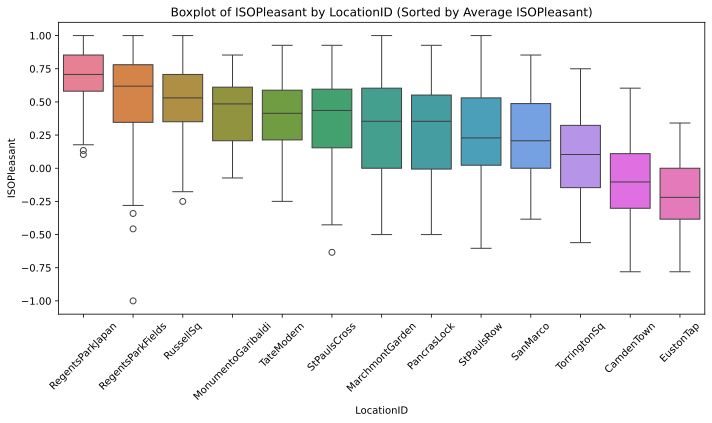

In [29]:
# Create a list of sorted LocationIDs
sorted_location_ids = sorted_ISOPleasant_per_location.index.tolist()

# Reorder the 'LocationID' column in the DataFrame based on the sorted list
ssid_sorted = ssid.copy()  # Create a copy of the original DataFrame
ssid_sorted['LocationID'] = pd.Categorical(ssid_sorted['LocationID'], categories=sorted_location_ids, ordered=True)  # Reorder the LocationID categories

# Create the boxplot
plt.figure(figsize=(10, 6))
sns.boxplot(x='LocationID', y='ISOPleasant', data=ssid_sorted, hue= 'LocationID') #, cut=0, inner_kws=dict(box_width=5, whis_width=0.2, color="0"))
plt.title('Boxplot of ISOPleasant by LocationID (Sorted by Average ISOPleasant)')
plt.xlabel('LocationID')
plt.ylabel('ISOPleasant')
plt.xticks(rotation=45)  # Rotate x-axis labels for better readability
plt.grid(False)
plt.tight_layout()
plt.show()


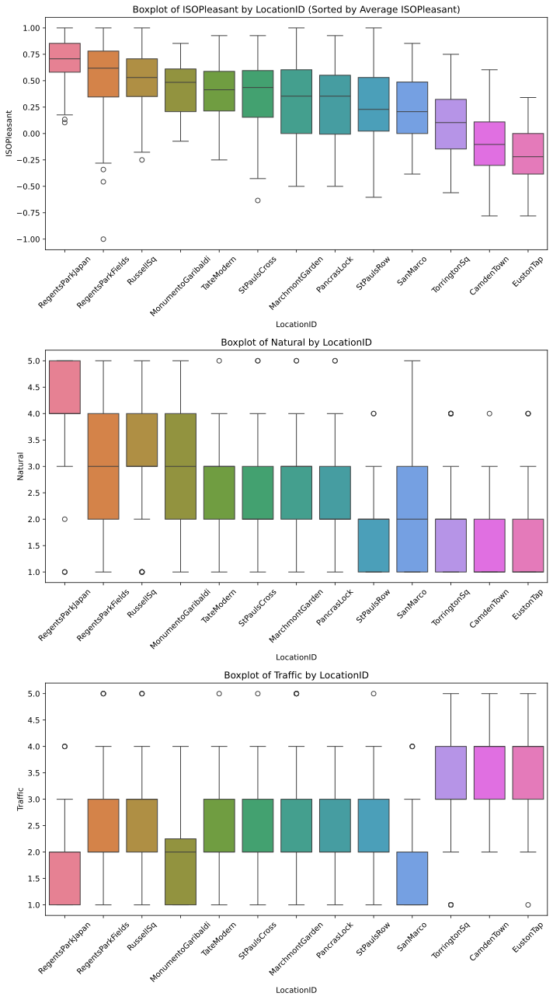

In [30]:
# Create a list of sorted LocationIDs
sorted_location_ids = sorted_ISOPleasant_per_location.index.tolist()

# Reorder the 'LocationID' column in the DataFrame based on the sorted list
ssid_sorted = ssid.copy()  # Create a copy of the original DataFrame
ssid_sorted['LocationID'] = pd.Categorical(ssid_sorted['LocationID'], categories=sorted_location_ids, ordered=True)  # Reorder the LocationID categories

# Create subplots
fig, axes = plt.subplots(3, 1, figsize=(10, 18))

# Boxplot of ISOPleasant by LocationID
sns.boxplot(ax=axes[0], x='LocationID', y='ISOPleasant', data=ssid_sorted, hue='LocationID')
axes[0].set_title('Boxplot of ISOPleasant by LocationID (Sorted by Average ISOPleasant)')
axes[0].set_xlabel('LocationID')
axes[0].set_ylabel('ISOPleasant')
axes[0].tick_params(axis='x', rotation=45)
axes[0].grid(False)

# Plot of Natural by LocationID
sns.boxplot(ax=axes[1], x='LocationID', y='Natural', data=ssid_sorted, hue='LocationID')
axes[1].set_title('Boxplot of Natural by LocationID')
axes[1].set_xlabel('LocationID')
axes[1].set_ylabel('Natural')
axes[1].tick_params(axis='x', rotation=45)
axes[1].grid(False)

# Plot of Traffic by LocationID
sns.boxplot(ax=axes[2], x='LocationID', y='Traffic', data=ssid_sorted, hue='LocationID')
axes[2].set_title('Boxplot of Traffic by LocationID')
axes[2].set_xlabel('LocationID')
axes[2].set_ylabel('Traffic')
axes[2].tick_params(axis='x', rotation=45)
axes[2].grid(False)

plt.tight_layout()
plt.show()


In [36]:
# @title group data by their location ids
filters_for_df = ['Traffic', 'Other', 'Human', 'Natural', 'ISOPleasant']
filters_for_df01 = ['Traffic', 'Other', 'Human', 'Natural', 'ISOPleasant', 'use00']

grouped_data_all = ssid.groupby('LocationID')
grouped_data = ssid.groupby('LocationID')[filters_for_df]


## correlation matrix spearman overall


In [14]:
# @title CMAP
cmap = sns.diverging_palette(10, 220, as_cmap=True)

In [33]:
## create function for plotting the correlation matrixes
def spearmanr_correlation_matrix(df, filters):
    """
    create spearmanr correlations and returns the correlation matrix and p-values.

    Parameters:
    df (pd.DataFrame): The DataFrame to plot.
    filters (list of str): Columns to include in the correlation calculation.
    cmap (str): Colormap for the heatmap. Default is 'coolwarm'.

    Returns:
    correlation_matrix (pd.DataFrame): The Spearman correlation matrix.
    p_values (np.ndarray): The p-values matrix.
    """
    # Calculate Spearman correlation
    correlation_matrix, p_values = spearmanr(df[filters], nan_policy='omit')

    # Create DataFrame from correlation matrix
    correlation_df = pd.DataFrame(correlation_matrix, columns=filters, index=filters)
    p_values_df = pd.DataFrame(p_values, columns=filters, index=filters)

    return correlation_df, p_values_df


def plot_spearman_correlation_heatmap(correlation_df, title, cmap=cmap, fontsize=12):
    """
    Plots a Spearman correlation heatmap for a DataFrame and returns the correlation matrix and p-values.

    Parameters:
    correlation_df (df): correlation matrix from spearmanr_correlation_matrix
    cmap (str): Colormap for the heatmap. Default is 'coolwarm'.

    Returns:
    plotted heatmap
    """

    # Generate a mask for the upper triangle; True = do NOT show
    mask = np.zeros_like(correlation_df, dtype=bool)
    mask[np.triu_indices_from(mask)] = True

    # Create a heatmap
    plt.figure(figsize=(10, 8))
    sns.heatmap(correlation_df, mask=mask, annot=True, cmap=cmap, fmt='.2f', linewidths=2, vmin=-0.5, vmax=0.5, annot_kws={"fontsize": fontsize})
    plt.title(f"Spearman Correlation Heatmap: {title}")
    plt.show()


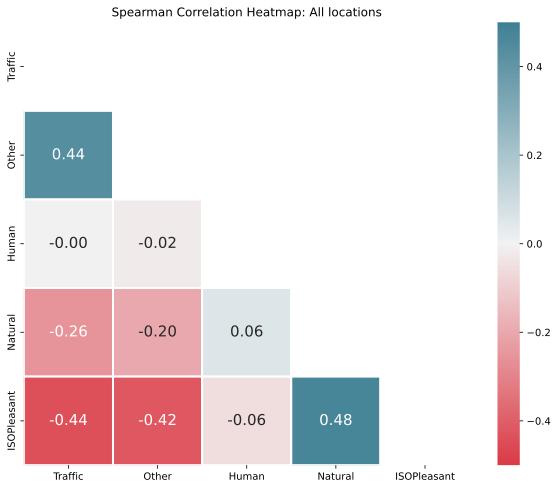

In [34]:
correlation_df, p_values_df = spearmanr_correlation_matrix(ssid, filters_for_df)

plot_spearman_correlation_heatmap(correlation_df, title = 'All locations', fontsize=15)

# # Print p-values for the 4th column (index 4)
# print(f"P-values for the column {filters_for_df[4]}:")
# print(p_values[:, 4])

In [21]:
ssid

,LocationID,SessionID,GroupID,RecordID,Language,Lockdown,start_time,end_time,latitude,longitude,...,"FS_Avg,arith(vacil)","I_HM_Avg,arith(iu)","Ton_HM_Avg,arith(tuHMS)",LZeq_L(dB(SPL)),LAeq_L(A)(dB(SPL)),LA10_LA90(dB(SPL)),LCeq_LAeq(dB(SPL)),LC10_LC90(dB(SPL)),RA_2D_cp(cPa),PA(Zwicker)
0,CamdenTown,CamdenTown1,CT101,525.0,English,0,2019-05-02 11:40:00,2019-05-02 11:43:00,51.539124,-0.142624,...,0.01700,0.358,0.309,79.72,70.07,7.78,7.81,8.11,14.3,36.019181
1,CamdenTown,CamdenTown1,CT101,561.0,English,0,2019-05-02 11:40:00,2019-05-02 11:43:00,51.539124,-0.142624,...,0.01700,0.358,0.309,79.72,70.07,7.78,7.81,8.11,14.3,36.019181
2,CamdenTown,CamdenTown1,CT101,526.0,English,0,2019-05-02 11:41:00,2019-05-02 11:44:00,51.539124,-0.142624,...,0.01700,0.358,0.309,79.72,70.07,7.78,7.81,8.11,14.3,36.019181
3,CamdenTown,CamdenTown1,CT102,560.0,English,0,2019-05-02 11:50:00,2019-05-02 11:53:00,51.539124,-0.142624,...,0.01790,0.362,0.268,80.27,71.26,8.38,6.25,7.82,14.7,40.523268
4,CamdenTown,CamdenTown1,CT103,527.0,English,0,2019-05-02 11:49:00,2019-05-02 11:54:00,51.539124,-0.142624,...,0.00889,0.370,0.193,76.79,66.71,4.23,7.61,3.99,13.4,27.108635
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1862,TorringtonSq,TorringtonSq4,TS425,1275.0,English,0,2019-10-22 14:02:00,2019-10-22 14:07:00,51.523300,-0.131100,...,0.03750,0.391,0.336,70.83,67.11,6.89,3.25,5.51,13.6,31.166903
1863,TorringtonSq,TorringtonSq4,TS426,1279.0,English,0,2019-10-22 14:10:00,2019-10-22 14:16:00,51.523300,-0.131100,...,0.04250,0.415,0.262,73.79,69.48,9.84,3.85,9.24,14.0,38.629748
1864,TorringtonSq,TorringtonSq4,TS426,1278.0,English,0,2019-10-22 14:12:00,2019-10-22 14:16:00,51.523300,-0.131100,...,0.04250,0.415,0.262,73.79,69.48,9.84,3.85,9.24,14.0,38.629748
1866,TorringtonSq,TorringtonSq4,TS426,1280.0,English,0,2019-10-22 14:12:00,2019-10-22 14:16:00,51.523300,-0.131100,...,0.04250,0.415,0.262,73.79,69.48,9.84,3.85,9.24,14.0,38.629748


## partial correlations @calculate_correlations

In [ ]:
from scipy.stats import spearmanr
from pingouin import partial_corr

def calculate_correlations(df, var1, var2, var3):
    # Calculate Spearman correlations
    spearman_corr_var1_var2 = spearmanr(df[var1], df[var2], nan_policy='omit').correlation
    spearman_corr_var2_var3 = spearmanr(df[var2], df[var3], nan_policy='omit').correlation
    spearman_corr_var1_var3 = spearmanr(df[var1], df[var3], nan_policy='omit').correlation

    # Print Spearman correlations
    print("Spearman Correlation Results:")
    print(" - {} and {}: {:.4f}".format(var1, var2, spearman_corr_var1_var2))
    print(" - {} and {}: {:.4f}".format(var2, var3, spearman_corr_var2_var3))
    print(" - {} and {}: {:.4f}".format(var1, var3, spearman_corr_var1_var3))

    # Calculate partial correlations
    partial_corr_result_1 = partial_corr(df, x=var1, y=var2, covar=var3, method='spearman')
    partial_corr_result_2 = partial_corr(df, x=var2, y=var3, covar=var1, method='spearman')
    partial_corr_result_3 = partial_corr(df, x=var1, y=var3, covar=var2, method='spearman')

    # Extract partial correlation values
    partial_corr_var1_var2 = partial_corr_result_1['r'][0]
    partial_corr_var2_var3 = partial_corr_result_2['r'][0]
    partial_corr_var1_var3 = partial_corr_result_3['r'][0]

    # Print partial correlations
    print("\nPartial Correlation Results (Controlling for the Third Variable):")
    print(" - {} and {} (controlling for {}): {:.4f}".format(var1, var2, var3, partial_corr_var1_var2))
    print(" - {} and {} (controlling for {}): {:.4f}".format(var2, var3, var1, partial_corr_var2_var3))
    print(" - {} and {} (controlling for {}): {:.4f}".format(var1, var3, var2, partial_corr_var1_var3))

# Test the function
calculate_correlations(ssid, 'Traffic', 'ISOPleasant', 'N10_N90(soneGF)')
# calculate_correlations(ssid, 'N10_N90(soneGF)', 'ISOPleasant', 'Rough_HM_R(asper)')


<frozen importlib._bootstrap>:914: ImportWarning: _PyDrive2ImportHook.find_spec() not found; falling back to find_module()
<frozen importlib._bootstrap>:914: ImportWarning: _PyDriveImportHook.find_spec() not found; falling back to find_module()
<frozen importlib._bootstrap>:914: ImportWarning: _GenerativeAIImportHook.find_spec() not found; falling back to find_module()
<frozen importlib._bootstrap>:914: ImportWarning: _OpenCVImportHook.find_spec() not found; falling back to find_module()
<frozen importlib._bootstrap>:914: ImportWarning: APICoreClientInfoImportHook.find_spec() not found; falling back to find_module()
<frozen importlib._bootstrap>:914: ImportWarning: _BokehImportHook.find_spec() not found; falling back to find_module()
<frozen importlib._bootstrap>:914: ImportWarning: _AltairImportHook.find_spec() not found; falling back to find_module()


Spearman Correlation Results:
 - Traffic and ISOPleasant: -0.4419
 - ISOPleasant and N10_N90(soneGF): -0.4686
 - Traffic and N10_N90(soneGF): 0.2277

Partial Correlation Results (Controlling for the Third Variable):
 - Traffic and ISOPleasant (controlling for N10_N90(soneGF)): -0.3896
 - ISOPleasant and N10_N90(soneGF) (controlling for Traffic): -0.4213
 - Traffic and N10_N90(soneGF) (controlling for ISOPleasant): 0.0261


## not important
heatmap of all the variables and how to group them


/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)
<ipython-input-13-018b2e41e1e8>:2: FutureWarning: The default value of numeric_only in DataFrame.corr is deprecated. In a future version, it will default to False. Select only valid columns or specify the value of numeric_only to silence this warning.
  partial_corr_matrix = ssid.corr(method='spearman').round(2)  # Calculate partial correlation matrix


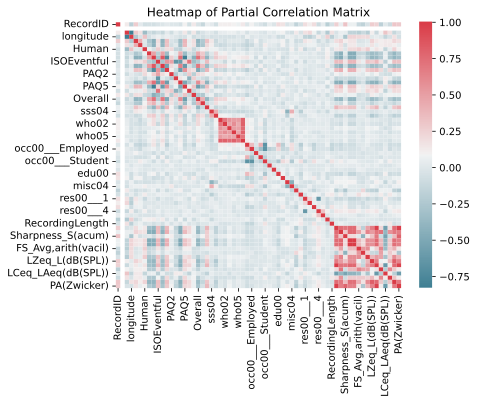

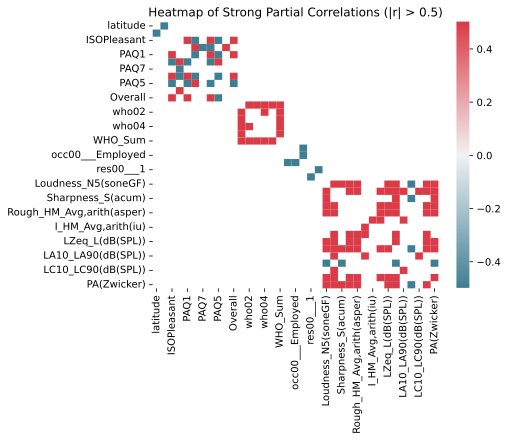

In [ ]:
# Plot heatmap of partial correlation matrix
partial_corr_matrix = ssid.corr(method='spearman').round(2)  # Calculate partial correlation matrix
sns.heatmap(partial_corr_matrix, annot=False, cmap=cmap,  fmt=".2f")
plt.title('Heatmap of Partial Correlation Matrix')
plt.show()

# Filter the matrix to show only strong correlations
strong_corr_matrix = partial_corr_matrix[(abs(partial_corr_matrix) > 0.5) & (partial_corr_matrix != 1.0)]

# Remove rows and columns with no strong correlations
strong_corr_matrix = strong_corr_matrix.dropna(how='all')
strong_corr_matrix = strong_corr_matrix.dropna(axis =1, how='all')

# Plot heatmap of strong partial correlations
sns.heatmap(strong_corr_matrix, annot=False, cmap=cmap, fmt=".2f", vmin = -0.5, vmax = 0.5)
plt.title('Heatmap of Strong Partial Correlations (|r| > 0.5)')
plt.show()


/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)
<ipython-input-16-1e41e093eba4>:6: FutureWarning: The default value of numeric_only in DataFrame.corr is deprecated. In a future version, it will default to False. Select only valid columns or specify the value of numeric_only to silence this warning.
  partial_corr_matrix = ssid.corr(method='spearman').round(2)


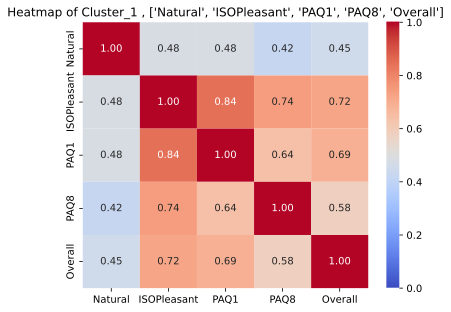

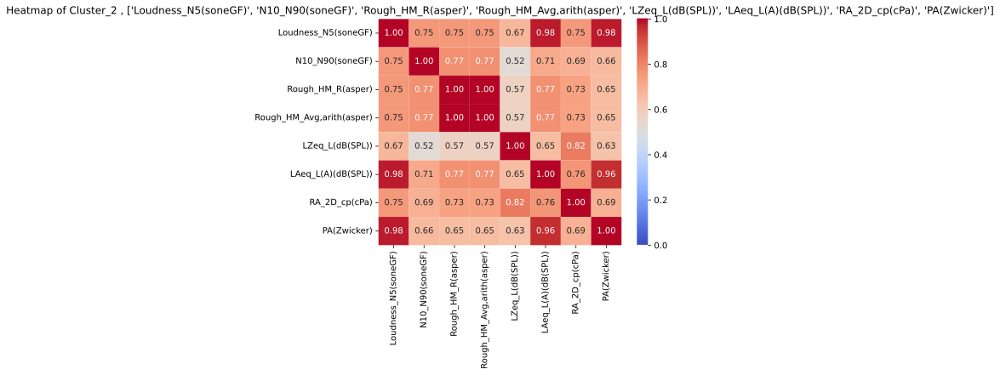

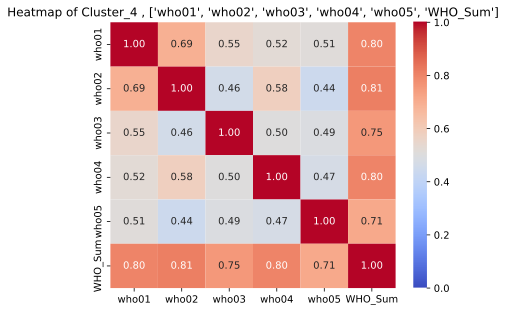

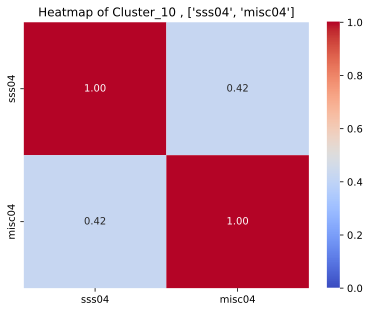

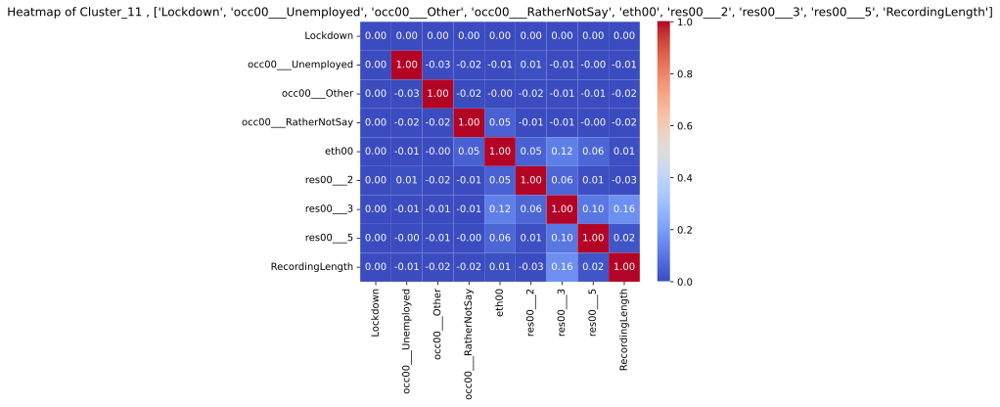

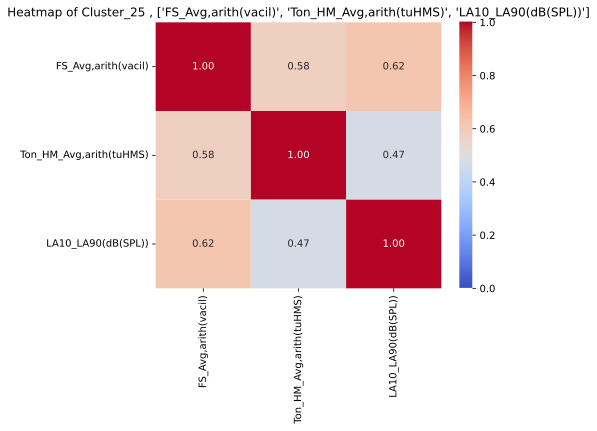

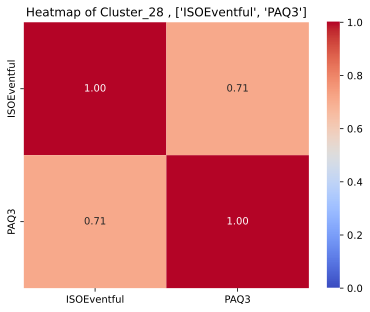

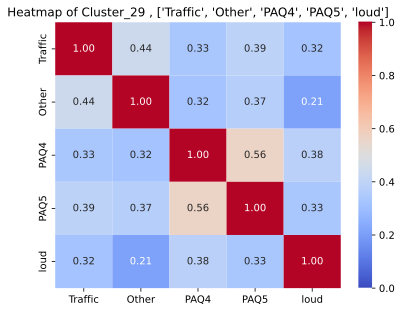

In [ ]:
import seaborn as sns
import matplotlib.pyplot as plt
from scipy.cluster import hierarchy

# Calculate partial correlation matrix
partial_corr_matrix = ssid.corr(method='spearman').round(2)
partial_corr_matrix = partial_corr_matrix.fillna(0)
# Replace every 1 with 0 in the DataFrame
# partial_corr_matrix = partial_corr_matrix.replace(1, 0.6)

# Hierarchical clustering
linkage_matrix = hierarchy.linkage(partial_corr_matrix, method='centroid', metric='euclidean')
clusters = hierarchy.fcluster(linkage_matrix, t=1.22, criterion='distance')

# Create a dictionary to store matrices for each cluster
cluster_matrices = {}
for i, cluster_id in enumerate(set(clusters)):
    cluster_indices = partial_corr_matrix.index[clusters == cluster_id]
    cluster_matrix = partial_corr_matrix.loc[cluster_indices, cluster_indices]
    if cluster_matrix.size > 1:  # Check if cluster matrix has more than one cell
        cluster_matrices[f'Cluster_{cluster_id}'] = cluster_matrix

# Plot heatmaps for each cluster
for cluster_name, cluster_matrix in cluster_matrices.items():
    sns.heatmap(cluster_matrix, annot=True, cmap='coolwarm', fmt=".2f", vmin = 0, vmax = 1)
    cluster_columns = cluster_matrix.columns.tolist()
    plt.title(f'Heatmap of {cluster_name} , {cluster_columns}')
    plt.show()


In [ ]:
## did this to remove a row
for cluster_name, cluster_matrix in cluster_matrices.items():
  print(cluster_matrix.columns)

nan_indices = ssid[ssid['Rough_HM_R(asper)'].isna()].index
print(nan_indices)
nan_indices = ssid[ssid['ISOPleasant'].isna()].index
print(nan_indices)
nan_indices = ssid[ssid['Natural'].isna()].index
print(nan_indices)

# Reset the index
ssid.reset_index(drop=True, inplace=True)

# Drop the row with the NaN value in the 'Natural' column based on position
ssid.drop(index=556, inplace=True)

Index(['Natural', 'ISOPleasant', 'pleasant', 'calm', 'Overall'], dtype='object')
Index(['Loudness_N5(soneGF)', 'N10_N90(soneGF)', 'Rough_HM_R(asper)',
       'Rough_HM_Avg,arith(asper)', 'Ton_HM_Avg,arith(tuHMS)',
       'LZeq_L(dB(SPL))', 'LAeq_L(A)(dB(SPL))', 'RA_2D_cp(cPa)',
       'PA(Zwicker)'],
      dtype='object')
Index(['who01', 'who02', 'who03', 'who04', 'who05', 'WHO_Sum'], dtype='object')
Index(['FS_Avg,arith(vacil)', 'LA10_LA90(dB(SPL))', 'LC10_LC90(dB(SPL))'], dtype='object')
Index(['Age', 'occ00___Employed', 'edu00'], dtype='object')
Index(['Lockdown', 'sss04', 'occ00___Unemployed', 'occ00___Other',
       'occ00___RatherNotSay', 'eth00', 'misc04', 'res00___2', 'res00___3',
       'res00___5', 'RecordingLength'],
      dtype='object')
Index(['ISOEventful', 'eventful'], dtype='object')
Index(['Traffic', 'Other', 'chaotic', 'annoying', 'loud'], dtype='object')


## create linear regression from sound source types

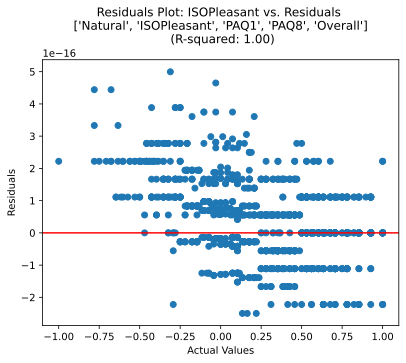

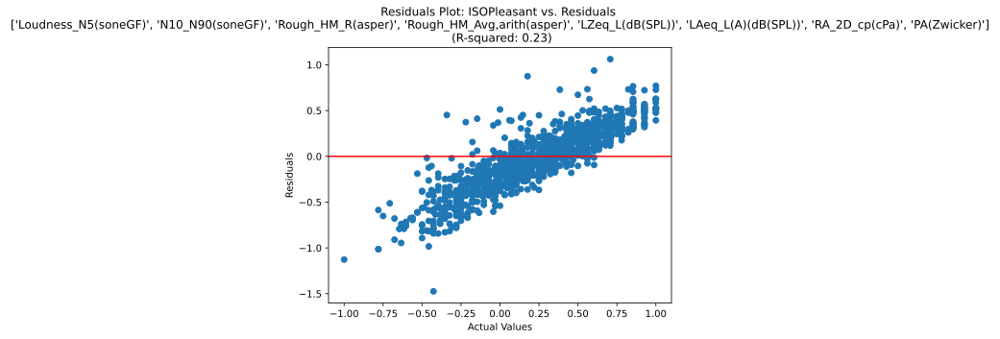

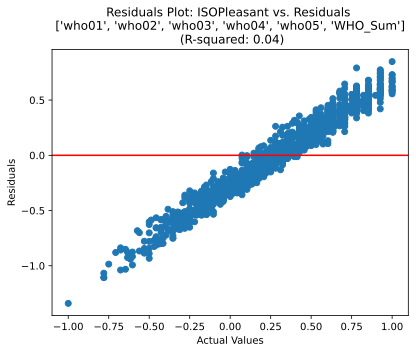

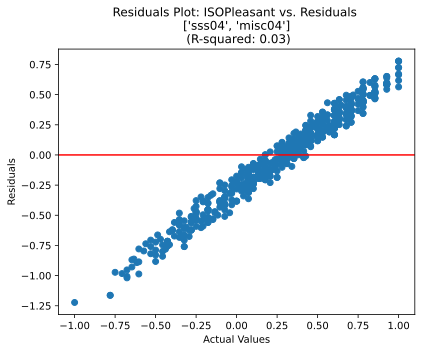

/usr/local/lib/python3.10/dist-packages/pandas/core/dtypes/cast.py:1641: DeprecationWarning: np.find_common_type is deprecated.  Please use `np.result_type` or `np.promote_types`.
See https://numpy.org/devdocs/release/1.25.0-notes.html and the docs for more information.  (Deprecated NumPy 1.25)
  return np.find_common_type(types, [])
/usr/local/lib/python3.10/dist-packages/pandas/core/dtypes/cast.py:1641: DeprecationWarning: np.find_common_type is deprecated.  Please use `np.result_type` or `np.promote_types`.
See https://numpy.org/devdocs/release/1.25.0-notes.html and the docs for more information.  (Deprecated NumPy 1.25)
  return np.find_common_type(types, [])
/usr/local/lib/python3.10/dist-packages/pandas/core/dtypes/cast.py:1641: DeprecationWarning: np.find_common_type is deprecated.  Please use `np.result_type` or `np.promote_types`.
See https://numpy.org/devdocs/release/1.25.0-notes.html and the docs for more information.  (Deprecated NumPy 1.25)
  return np.find_common_type(typ

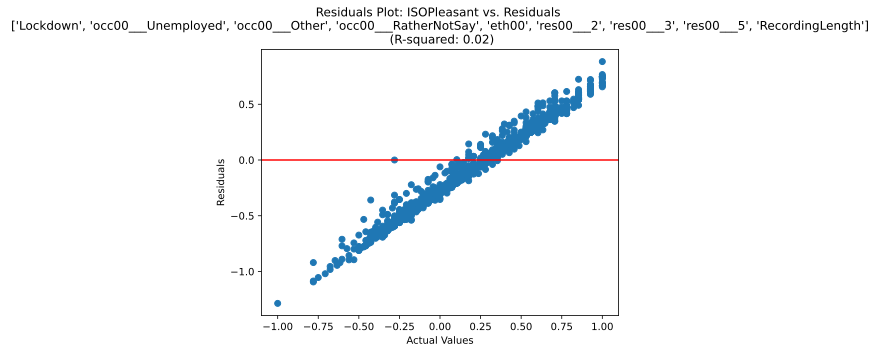

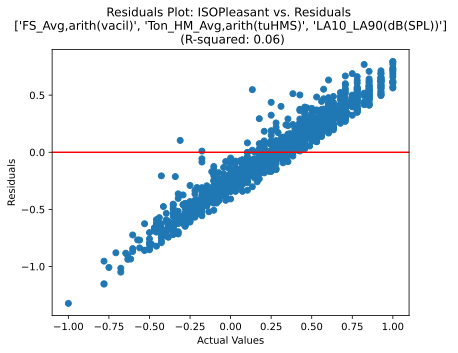

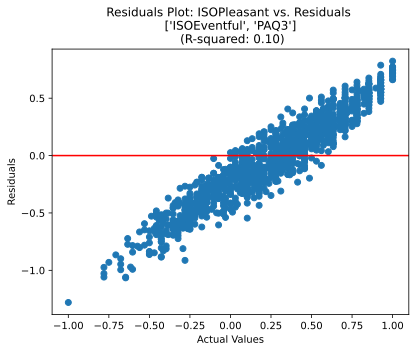

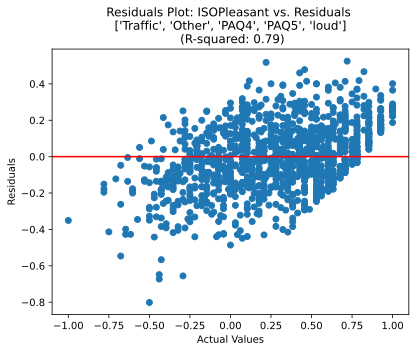

In [ ]:
from sklearn.linear_model import LinearRegression
from sklearn.metrics import r2_score

def fit_and_plot_residuals(data, columns, target):
    # Drop rows with missing or infinite values
    data = data.dropna(subset=columns, how='any')
    data = data.replace([np.inf, -np.inf], np.nan).dropna(subset=columns, how='any')

    # Fit the model
    X = data[columns]
    y = data[target]
    model = LinearRegression()
    model.fit(X, y)

    # Calculate residuals
    residuals = y - model.predict(X)

    # Calculate R-squared
    r_squared = r2_score(y, model.predict(X))

    # Plot residuals
    plt.scatter(y, residuals)
    plt.axhline(y=0, color='r', linestyle='-')
    plt.xlabel('Actual Values')
    plt.ylabel('Residuals')
    # plt.title('Residual Plot')
    plt.title(f'Residuals Plot: {target} vs. Residuals \n {columns} \n (R-squared: {r_squared:.2f})')
    plt.show()

# Example usage with cluster_matrices
for cluster_name, cluster_matrix in cluster_matrices.items():
    # Get the column names from the cluster matrix
    cluster_columns = cluster_matrix.columns.tolist()
    # Fit and plot residuals using the cluster columns
    fit_and_plot_residuals(ssid, cluster_columns, 'ISOPleasant')

In [ ]:
from sklearn.model_selection import train_test_split
from sklearn.linear_model import LinearRegression
from sklearn.metrics import r2_score


features_names = [
                   'Traffic',
                  #  'Human','Other',
                  'Natural',
                  # 'who01', 'who02', 'who03', 'who04', 'who05',
                  # 'WHO_Sum',
                  # 'Loudness_N5(soneGF)',
                  # 'N10_N90(soneGF)',
                  # 'Sharpness_S(acum)',
                  # 'Rough_HM_R(asper)',
                  # 'Rough_HM_Avg,arith(asper)'
                  ]

ssid_new = ssid.replace([np.inf, -np.inf], np.nan).dropna(subset=features_names, how='any')
ssid_new = ssid_new.sample(frac = 1)

target_name = "ISOPleasant"
X, y = ssid_new.drop(columns=target_name), ssid_new[target_name]
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=123)

regressor_with_ability = LinearRegression()
regressor_with_ability.fit(X_train[features_names], y_train)
y_pred_with_ability = regressor_with_ability.predict(X_test[features_names])
R2_with_ability = r2_score(y_test, y_pred_with_ability)

print(f"R2 score with ability: {R2_with_ability:.3f}")

R2 score with ability: 0.356


In [ ]:
import pandas as pd
import numpy as np
from sklearn.model_selection import train_test_split
from sklearn.linear_model import LinearRegression
from sklearn.metrics import r2_score
from itertools import combinations

# Define all possible features
all_features = [
    'Traffic',  'Natural',
    # 'who01', 'who02', 'who03', 'who04', 'who05','Human', 'Other',
    # 'WHO_Sum',
    'Loudness_N5(soneGF)',
    # 'N10_N90(soneGF)',
    'Sharpness_S(acum)', 'Rough_HM_R(asper)',
    # 'Rough_HM_Avg,arith(asper)'
]

all_features = [
    # 'LocationID', 'SessionID', 'GroupID', 'RecordID', 'Language',
      #  'Lockdown', 'start_time', 'end_time', 'latitude', 'longitude',
       'Traffic', 'Natural', 'Other', # 'Human',
      #  'ISOPleasant',
       'ISOEventful',#
      #  'pleasant', 'chaotic', 'vibrant', 'uneventful', 'calm', 'annoying',
      #  'eventful', 'monotonous', 'Overall', 'Appropriate', 'loud', 'sss04',
      #  'sss05', 'who01', 'who02', 'who03', 'who04', 'who05', 'WHO_Sum', 'Age',
      #  'Gender', 'occ00___Employed', 'occ00___Unemployed', 'occ00___Retired',
      #  'occ00___Student', 'occ00___Other', 'occ00___RatherNotSay',
      #  'occ00_other', 'Occupation', 'edu00', 'eth00', 'eth00_other', 'misc00',
      #  'misc03', 'misc03_other', 'misc04', 'misc01', 'use00', 'uni00',
      #  'res00___1', 'res00___2', 'res00___3', 'res00___4', 'res00___5',
      #  'res02', 'paper', 'RecordingLength',
        'Loudness_N5(soneGF)',
       'N10_N90(soneGF)', 'Sharpness_S(acum)', #'Rough_HM_R(asper)',
       'Rough_HM_Avg,arith(asper)', #'FS_Avg,arith(vacil)',
      #  'I_HM_Avg,arith(iu)', 'Ton_HM_Avg,arith(tuHMS)',
       'LZeq_L(dB(SPL))',
      #  'LAeq_L(A)(dB(SPL))', 'LA10_LA90(dB(SPL))', 'LCeq_LAeq(dB(SPL))',
      #  'LC10_LC90(dB(SPL))', 'RA_2D_cp(cPa)', 'PA(Zwicker)'
       ]

# Generate combinations of features
feature_combinations = [list(comb) for r in range(1, len(all_features)+1) for comb in combinations(all_features, r)]
# print(feature_combinations)
target_name = "ISOPleasant"

best_score = -float('inf')
best_features = []
# Define the number of runs for each combination
num_runs = 5

# Iterate over each combination of features
for features_names in feature_combinations:
    best_r2_for_combination = -float('inf')
    ssid_new = ssid.replace([np.inf, -np.inf], np.nan).dropna(subset=features_names, how='any')

    # Perform multiple runs and take the best R2 score
    for _ in range(num_runs):

        ssid_new = ssid_new.sample(frac=1)

        X, y = ssid_new.drop(columns=target_name), ssid_new[target_name]
        X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=123)

        regressor = LinearRegression()
        regressor.fit(X_train[features_names], y_train)
        y_pred = regressor.predict(X_test[features_names])
        R2 = r2_score(y_test, y_pred)

        if R2 > best_r2_for_combination:
            best_r2_for_combination = R2

    if best_r2_for_combination > best_score:
        best_score = best_r2_for_combination
        best_features = features_names

print(f"Best R2 score: {best_score:.3f}")
print(f"Best features: {best_features}")

Best R2 score: 0.510
Best features: ['Traffic', 'Natural', 'Other', 'ISOEventful', 'Loudness_N5(soneGF)', 'Sharpness_S(acum)', 'LZeq_L(dB(SPL))']


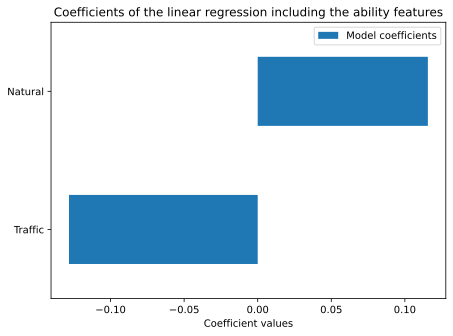

In [ ]:
import matplotlib.pyplot as plt

model_coef = pd.Series(regressor_with_ability.coef_, index=features_names)
coef = pd.concat(
    [model_coef],
    keys=[ "Model coefficients"],
    axis=1,
)
ax = coef.plot.barh()
ax.set_xlabel("Coefficient values")
ax.set_title("Coefficients of the linear regression including the ability features")
_ = plt.tight_layout()

## other correlations


### correlations with psychoacoustic parametres
returns a dataframe with the correlation and the p values

In [23]:
filter_acoustical = [ 'Loudness_N5(soneGF)',
       'N10_N90(soneGF)', 'Sharpness_S(acum)', 'Rough_HM_R(asper)',
       'Rough_HM_Avg,arith(asper)', 'FS_Avg,arith(vacil)',
       'I_HM_Avg,arith(iu)', 'Ton_HM_Avg,arith(tuHMS)', 'LZeq_L(dB(SPL))',
       'LAeq_L(A)(dB(SPL))', 'LA10_LA90(dB(SPL))', 'LCeq_LAeq(dB(SPL))',
       'LC10_LC90(dB(SPL))', 'RA_2D_cp(cPa)', 'PA(Zwicker)',
                      'Traffic', #'Other',
                      # 'Human',
                      'Natural',
                      'ISOPleasant'
        ]


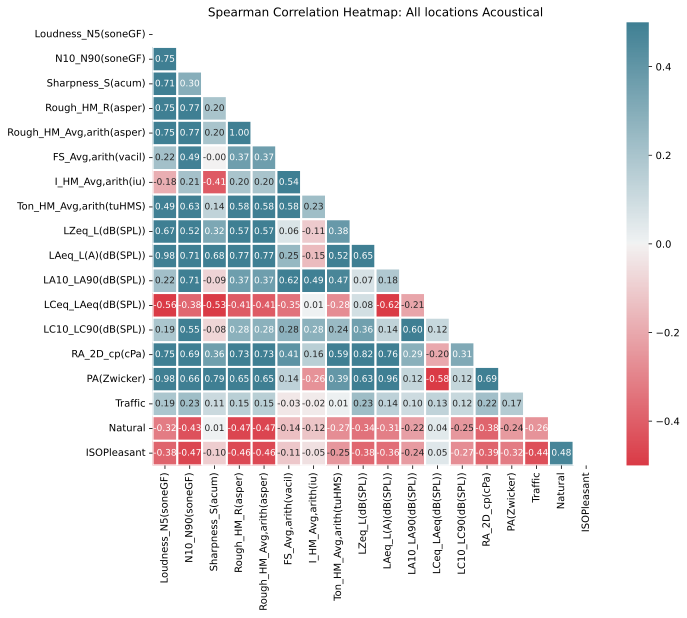

In [27]:
correlation_matrix, p_values = spearmanr_correlation_matrix(df=ssid, filters=filter_acoustical)

plot_spearman_correlation_heatmap(correlation_matrix, title = 'All locations Acoustical', fontsize=9)


# descriptive statistics (MEAN)

mean, median mode per location

In [ ]:

# Calculate mean, median, and mode for each group
mean_values = grouped_data.mean()
median_values = grouped_data.median()
mode_values = grouped_data.apply(lambda x: x.mode().iloc[0] if len(x.mode()) > 0 else None)


# # Display the results
# print("Mean Values:")
mean_values.round(2)



,Traffic,Other,Human,Natural,ISOPleasant
LocationID,,,,,
CamdenTown,3.76,2.67,3.27,1.34,-0.09
EustonTap,3.69,2.91,2.53,1.61,-0.21
MarchmontGarden,2.64,2.48,2.67,2.57,0.31
MonumentoGaribaldi,1.91,1.97,3.38,3.03,0.42
PancrasLock,2.40,3.27,2.49,2.39,0.28
RegentsParkFields,2.38,1.87,2.91,3.11,0.52
RegentsParkJapan,1.84,1.49,2.51,4.03,0.70
RussellSq,2.73,2.13,3.00,3.29,0.51
SanMarco,1.42,1.92,4.04,2.22,0.22


/usr/local/lib/python3.10/dist-packages/pandas/core/algorithms.py:522: DeprecationWarning: np.find_common_type is deprecated.  Please use `np.result_type` or `np.promote_types`.
See https://numpy.org/devdocs/release/1.25.0-notes.html and the docs for more information.  (Deprecated NumPy 1.25)
  common = np.find_common_type([values.dtype, comps_array.dtype], [])
/usr/local/lib/python3.10/dist-packages/pandas/core/algorithms.py:522: DeprecationWarning: np.find_common_type is deprecated.  Please use `np.result_type` or `np.promote_types`.
See https://numpy.org/devdocs/release/1.25.0-notes.html and the docs for more information.  (Deprecated NumPy 1.25)
  common = np.find_common_type([values.dtype, comps_array.dtype], [])
/usr/local/lib/python3.10/dist-packages/pandas/core/algorithms.py:522: DeprecationWarning: np.find_common_type is deprecated.  Please use `np.result_type` or `np.promote_types`.
See https://numpy.org/devdocs/release/1.25.0-notes.html and the docs for more information.  (D

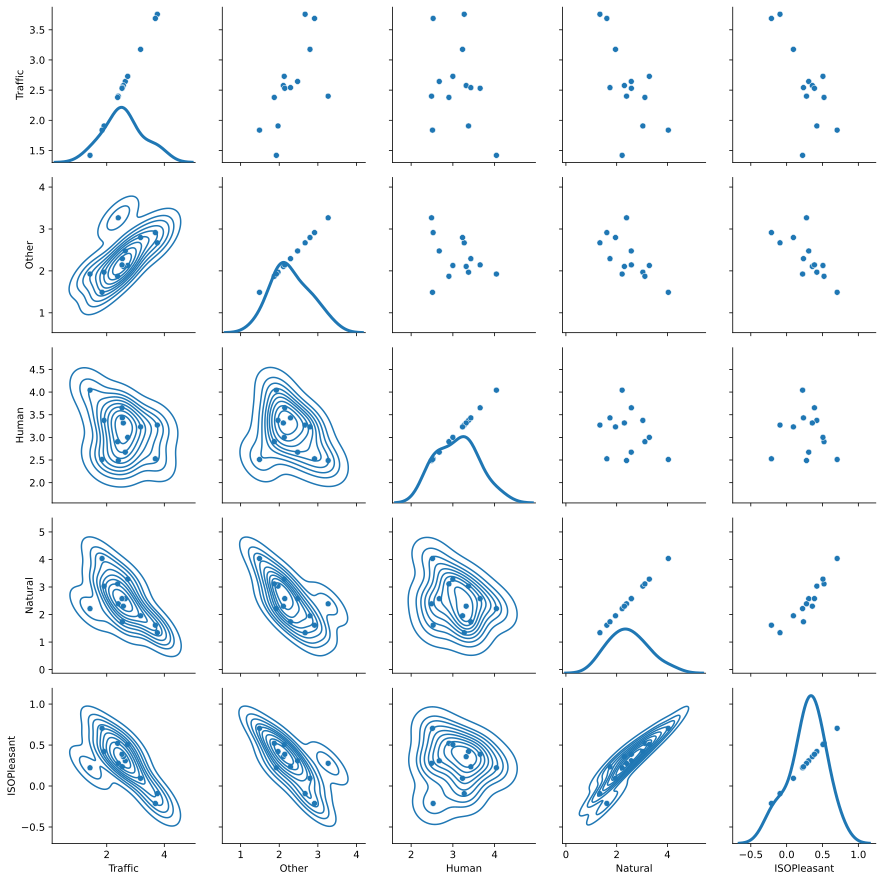

In [ ]:
g = sns.PairGrid(mean_values)
g.map(sns.scatterplot)
g.map_lower(sns.kdeplot)
g.map_diag(sns.kdeplot, lw=3, legend=False)

##correlation from mean

In [ ]:
# create a correlation matrix
correlation_matrix_from_mean = mean_values.corr()
print("\nCorrelation Matrix:")
correlation_matrix_from_mean



Correlation Matrix:


,Traffic,Other,Human,Natural,ISOPleasant
Traffic,1.000000,0.649348,-0.292868,-0.625885,-0.722122
Other,0.649348,1.000000,-0.314110,-0.679009,-0.728507
Human,-0.292868,-0.314110,1.000000,-0.277598,-0.062927
Natural,-0.625885,-0.679009,-0.277598,1.000000,0.919399
ISOPleasant,-0.722122,-0.728507,-0.062927,0.919399,1.000000


Text(0.5, 1.0, 'Correlation Heatmap: Mean per location')

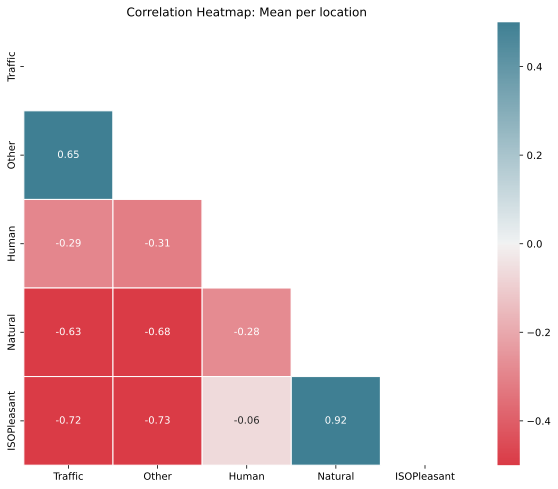

In [ ]:
# Generate a mask for the upper triangle; True = do NOT show
mask = np.zeros_like(correlation_matrix_from_mean, dtype=bool)
mask[np.triu_indices_from(mask)] = True

# Create a heatmap
plt.figure(figsize=(10, 8))
sns.heatmap(correlation_matrix_from_mean, annot=True, cmap=cmap, mask=mask, fmt='.2f', linewidths=1, vmin = -0.5 , vmax = 0.5)
plt.title("Correlation Heatmap: Mean per location")
# plt.show()

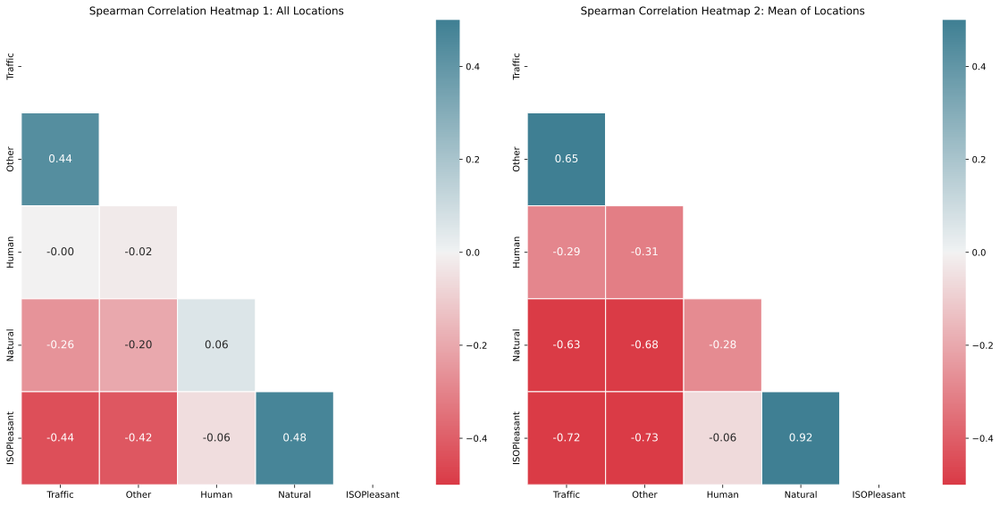

In [ ]:
# Calculate Spearman correlation
correlation_matrix01, p_values01 = spearmanr(ssid[filters_for_df], nan_policy='omit')
# Create DataFrame from correlation matrix
correlation_df01 = pd.DataFrame(correlation_matrix01, columns=filters_for_df, index=filters_for_df)

# Generate a mask for the upper triangle; True = do NOT show
mask = np.zeros_like(correlation_matrix01, dtype=bool)
mask[np.triu_indices_from(mask)] = True

# Create subplots with 1 row and 2 columns
fig, axes = plt.subplots(1, 2, figsize=(16, 8))

# Plot the first heatmap
sns.heatmap(correlation_df01, mask=mask, annot=True, cmap=cmap, fmt='.2f', linewidths=1, vmin=-0.5, vmax=0.5,
            annot_kws={"fontsize": 12}, ax=axes[0])  # Set the font size for annotations
axes[0].set_title("Spearman Correlation Heatmap 1: All Locations")

# Plot the second heatmap
sns.heatmap(correlation_matrix_from_mean, mask=mask, annot=True, cmap=cmap, fmt='.2f', linewidths=1, vmin=-0.5, vmax=0.5,
            annot_kws={"fontsize": 12}, ax=axes[1])  # Set the font size for annotations
axes[1].set_title("Spearman Correlation Heatmap 2: Mean of Locations")

plt.tight_layout()  # Adjust layout to prevent overlap
plt.show()

In [ ]:
def correlation_summary(correlation_coef, p_value, confidence_interval):
    if p_value < 0.05:
        significance = "statistically significant"
    else:
        significance = "not statistically significant"

    if correlation_coef >= 0.8:
        strength = "very strong"
    elif 0.6 <= correlation_coef < 0.8:
        strength = "strong"
    elif 0.4 <= correlation_coef < 0.6:
        strength = "moderate"
    elif 0.2 <= correlation_coef < 0.4:
        strength = "weak"
    else:
        strength = "very weak"

    # print("Correlation summary:")
    print(f"Pearson correlation coefficient: {correlation_coef:.4f}")
    print(f"P-value: {p_value:.4f} ({significance})")
    print(f"95% Confidence interval: {confidence_interval}")
    print(f"Strength of correlation: {strength}")

# correlation_summary(pearson_corr, p_value, confidence_interval)

In [ ]:
from scipy.stats import pearsonr
import numpy as np

columns_of_interest = ['Natural', 'Traffic', 'Human', 'Other']
descriptor_column = ['ISOPleasant'] #, 'Overall']

for col_name in columns_of_interest:
  for col_name2 in descriptor_column:
      col = mean_values[col_name]
      col2 =  mean_values[col_name2]

      # Calculate Pearson correlation coefficient and p-value
      pearson_corr, p_value = pearsonr(col, col2)

      # Calculate confidence interval
      num_samples = len(col)
      confidence_interval = (
          pearson_corr - 1.96 * np.sqrt((1 - pearson_corr ** 2) / (num_samples - 2)),
          pearson_corr + 1.96 * np.sqrt((1 - pearson_corr ** 2) / (num_samples - 2))
      )

      print("Correlation between", col.name, '&', col2.name)
      correlation_summary(pearson_corr, p_value, confidence_interval)
      print()  # Empty line for better readability between correlations


### correlation from mean psycho -acoustic

In [ ]:
grouped_data_02 = ssid.groupby('LocationID')[filter_acoustical]

# Calculate mean, median, and mode for each group
mean_values02 = grouped_data_02.mean()

# # Display the results
# print("Mean Values:")
mean_values02.round(3)

In [ ]:
from matplotlib import pyplot as plt
mean_values02.plot(kind='scatter', x='ISOPleasant', y='Rough_HM_R(asper)', s=32, alpha=.8)
plt.gca().spines[['top', 'right',]].set_visible(False)

In [ ]:
# create a correlation matrix
correlation_matrix_from_mean = mean_values02.corr()
print("\nCorrelation Matrix:")
correlation_matrix_from_mean


In [ ]:
# Generate a mask for the upper triangle; True = do NOT show
mask = np.zeros_like(correlation_matrix_from_mean, dtype=bool)
mask[np.triu_indices_from(mask)] = True

cmap = sns.diverging_palette(220, 10, as_cmap=True)

# Create a heatmap
plt.figure(figsize=(10, 8))
sns.heatmap(correlation_matrix_from_mean, annot=True, cmap=cmap, mask=mask, fmt='.2f', linewidths=1, vmin = -0.5 , vmax = 0.5)
plt.title("Correlation Heatmap: Mean per location")
# plt.show()

## correlation from median


In [ ]:
# create a correlation matrix
correlation_matrix_from_median = median_values.corr()
print("\nCorrelation Matrix:")
correlation_matrix_from_median


Correlation Matrix:


/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


,Traffic,Other,Human,Natural,ISOPleasant
Traffic,1.000000,0.442912,-0.407472,-0.542373,-0.640002
Other,0.442912,1.000000,-0.285891,-0.708659,-0.663640
Human,-0.407472,-0.285891,1.000000,0.027909,0.024704
Natural,-0.542373,-0.708659,0.027909,1.000000,0.908057
ISOPleasant,-0.640002,-0.663640,0.024704,0.908057,1.000000


Text(0.5, 1.0, 'Correlation Heatmap')

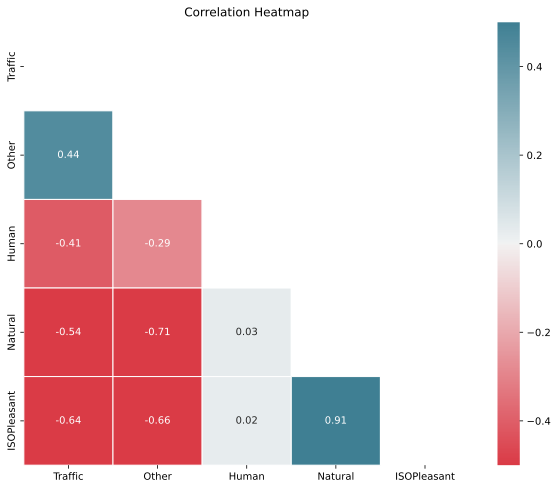

In [ ]:
# Create a heatmap
plt.figure(figsize=(10, 8))
sns.heatmap(correlation_matrix_from_median, annot=True, cmap=cmap, mask = mask, fmt='.2f', linewidths=1, vmin = -0.5 , vmax = 0.5)
plt.title("Correlation Heatmap")
# plt.show()

## likert scale analysis 1 location


In [ ]:
# filtering to the first location
filter_location = ['CamdenTown']

# selecting rows based on this location
ssid_location1 = ssid.loc[ssid['LocationID'].isin(filter_location)]

# selecting the comlumns for analysis
ssid_location1_filtered = ssid_location1[filters_for_df]
ssid_location1_filtered.tail()

/usr/local/lib/python3.10/dist-packages/pandas/core/algorithms.py:522: DeprecationWarning: np.find_common_type is deprecated.  Please use `np.result_type` or `np.promote_types`.
See https://numpy.org/devdocs/release/1.25.0-notes.html and the docs for more information.  (Deprecated NumPy 1.25)
  common = np.find_common_type([values.dtype, comps_array.dtype], [])


,Traffic,Other,Human,Natural,ISOPleasant
101,3.0,1.0,5.0,2.0,0.0732
102,4.0,4.0,4.0,4.0,-0.7803
103,3.0,1.0,3.0,1.0,-0.4571
104,4.0,4.0,3.0,1.0,-0.7071
105,5.0,3.0,4.0,1.0,-0.3964



spearmans rho correlation

/usr/local/lib/python3.10/dist-packages/pandas/core/algorithms.py:522: DeprecationWarning: np.find_common_type is deprecated.  Please use `np.result_type` or `np.promote_types`.
See https://numpy.org/devdocs/release/1.25.0-notes.html and the docs for more information.  (Deprecated NumPy 1.25)
  common = np.find_common_type([values.dtype, comps_array.dtype], [])
/usr/local/lib/python3.10/dist-packages/pandas/core/algorithms.py:522: DeprecationWarning: np.find_common_type is deprecated.  Please use `np.result_type` or `np.promote_types`.
See https://numpy.org/devdocs/release/1.25.0-notes.html and the docs for more information.  (Deprecated NumPy 1.25)
  common = np.find_common_type([values.dtype, comps_array.dtype], [])
/usr/local/lib/python3.10/dist-packages/pandas/core/algorithms.py:522: DeprecationWarning: np.find_common_type is deprecated.  Please use `np.result_type` or `np.promote_types`.
See https://numpy.org/devdocs/release/1.25.0-notes.html and the docs for more information.  (D

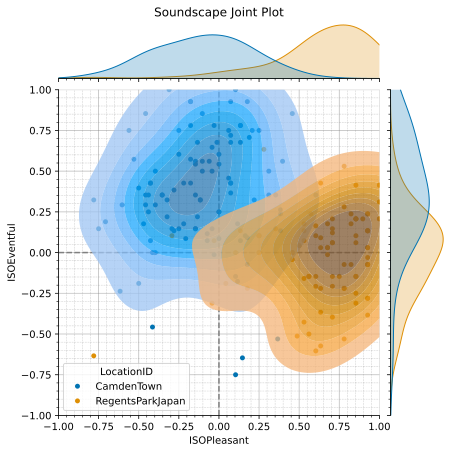

In [ ]:
from soundscapy.databases import isd
sspy.plotting.jointplot(
        isd.select_location_ids(ssid, ["CamdenTown", "RegentsParkJapan"]),
        hue="LocationID", marginal_kind="kde", density_type="full")

## Creating  spearsonr correlation matrix and p values per location
returns a dataframe with the correlation and the p values

below is the simple version of creating the correlation per location

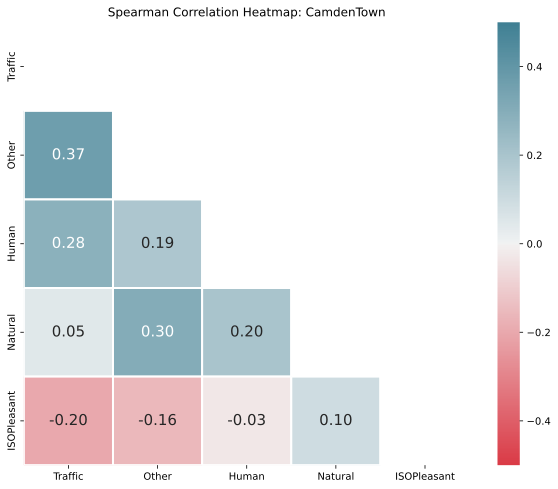

C:\Users\n.smit\AppData\Local\Temp\ipykernel_21948\1594703440.py:21: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  correlation_result_df = pd.concat([correlation_result_df, correlation_df], ignore_index=False)
C:\Users\n.smit\AppData\Local\Temp\ipykernel_21948\1594703440.py:22: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  p_values_result_df = pd.concat([p_values_result_df, p_values_df], ignore_index=False)


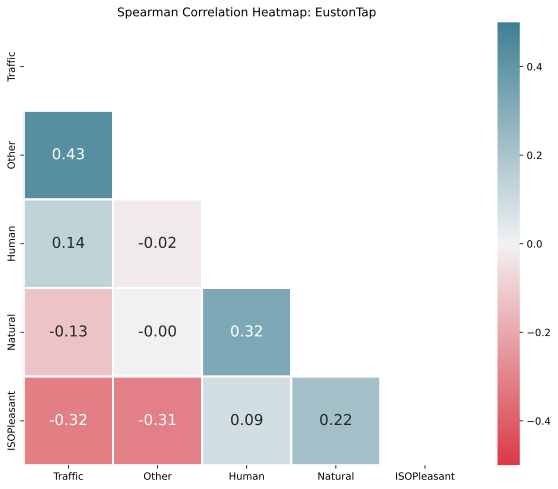

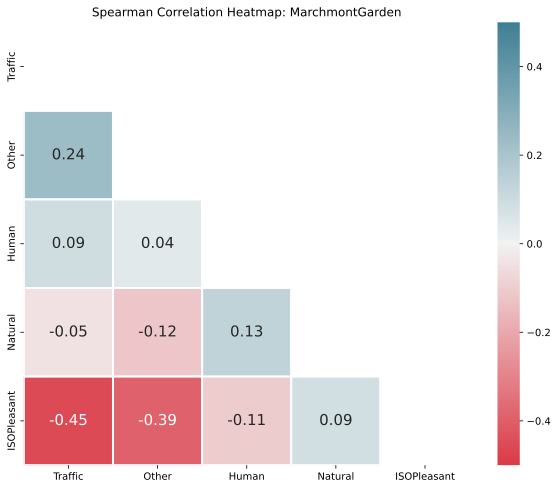

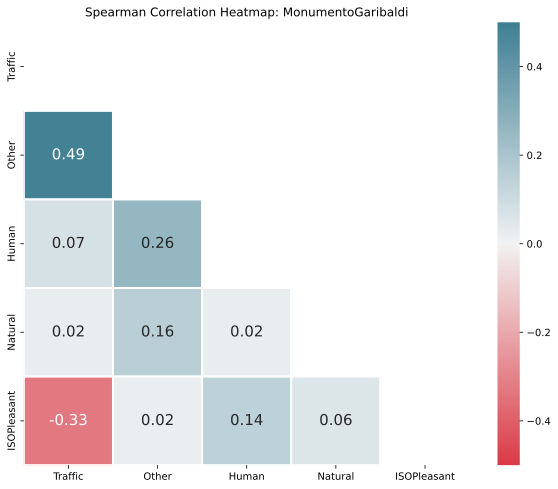

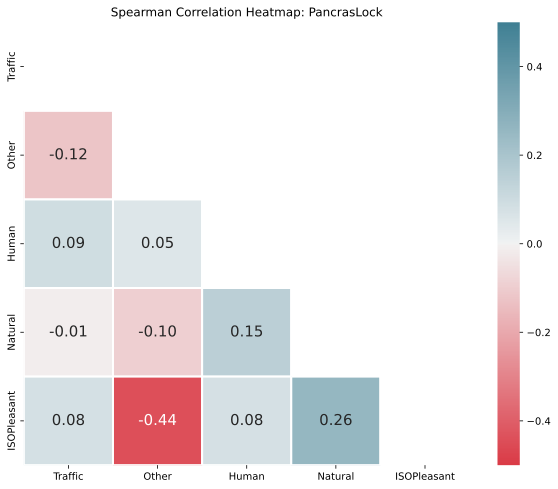

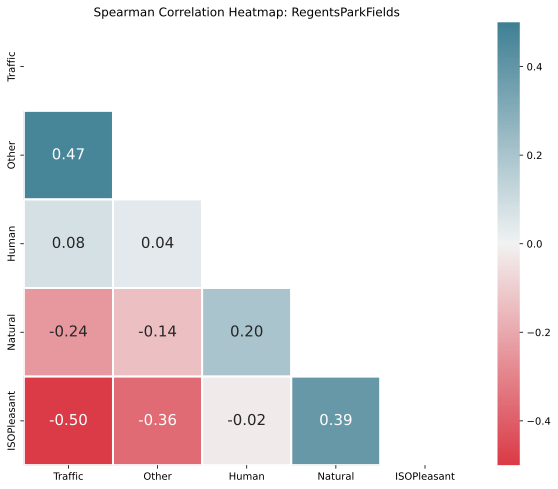

...

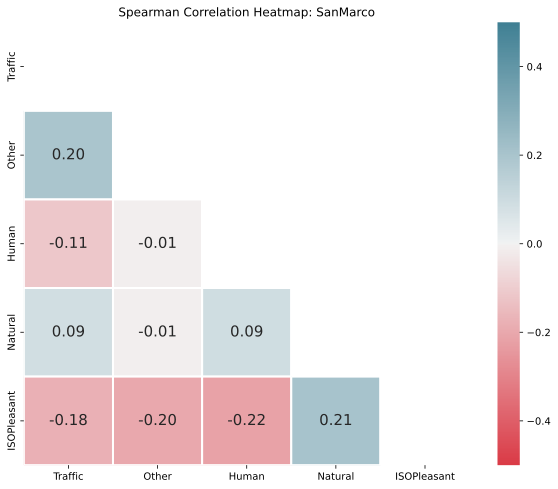

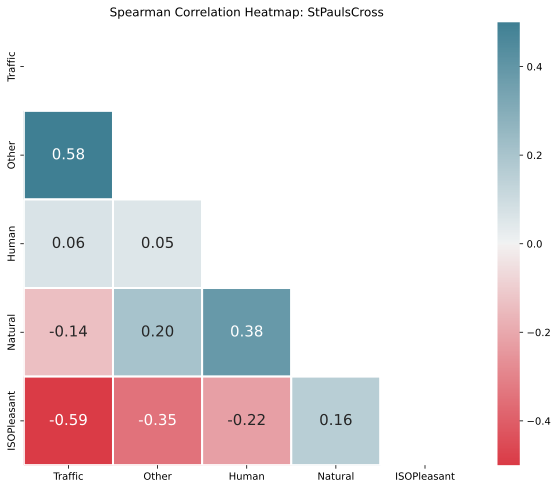

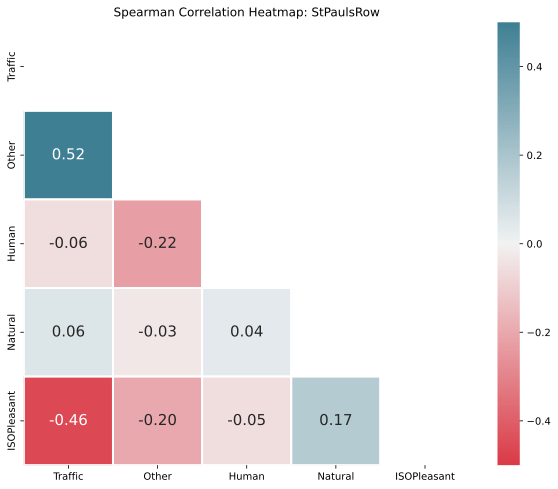

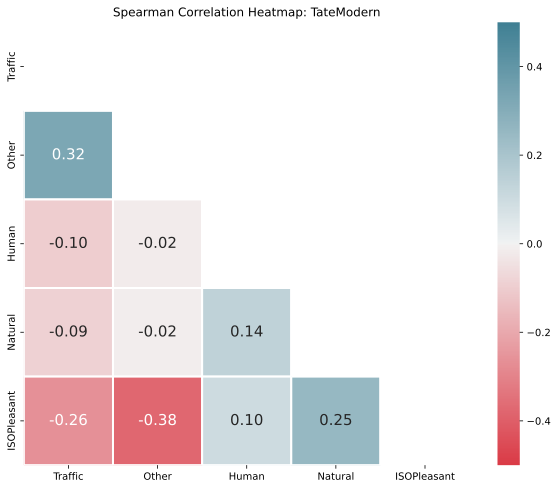

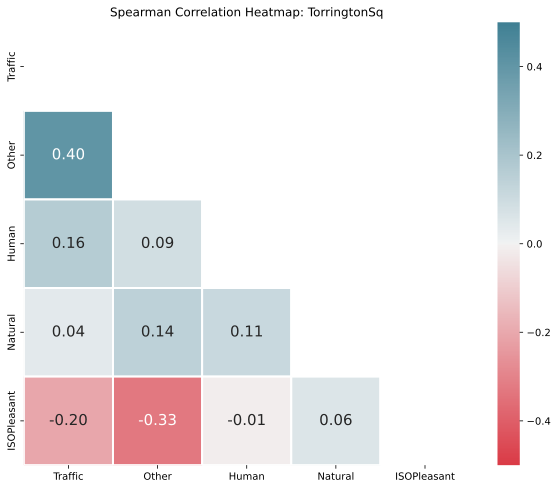

In [37]:
# Create empty DataFrames to store results
correlation_result_df = pd.DataFrame(columns=['LocationID'] + filters_for_df)
p_values_result_df = pd.DataFrame(columns=['LocationID'] + filters_for_df)


for name, group in grouped_data:
    correlation_df, p_values_df = spearmanr_correlation_matrix(df=group, filters=filters_for_df)
    plot_spearman_correlation_heatmap(correlation_df, title = name, fontsize = 15)

    # Convert the correlation matrix and p-values to dataframes
    p_values_df = pd.DataFrame(p_values, columns=filters_for_df, index=filters_for_df)

    # Add LocationID and Filter columns
    correlation_df.insert(0, 'LocationID', name)
    correlation_df.insert(1,'Filter', filters_for_df)

    p_values_df.insert(0, 'LocationID', name)
    p_values_df.insert(1, 'Filter', filters_for_df)

    # Append to the result DataFrames
    correlation_result_df = pd.concat([correlation_result_df, correlation_df], ignore_index=False)
    p_values_result_df = pd.concat([p_values_result_df, p_values_df], ignore_index=False)



# add distance from road to df
trying to plot the location

In [ ]:
# Step 1: Add a unique index column 'dataID' to ssid_gdf
ssid['dataID'] = range(len(ssid))
ssid[['dataID']].head()
print("length of data list:" , len(ssid))

length of data list: 1248


In [ ]:
#@title create gdf
# Assuming df is your GeoDataFrame with columns 'LocationID', 'latitude', and 'longitude'
points_lon_lat = gpd.points_from_xy(ssid['longitude'], ssid['latitude'])
ssid_gdf = gpd.GeoDataFrame(ssid, geometry=points_lon_lat)
ssid_gdf

,LocationID,SessionID,GroupID,RecordID,Language,Lockdown,start_time,end_time,latitude,longitude,...,"Ton_HM_Avg,arith(tuHMS)",LZeq_L(dB(SPL)),LAeq_L(A)(dB(SPL)),LA10_LA90(dB(SPL)),LCeq_LAeq(dB(SPL)),LC10_LC90(dB(SPL)),RA_2D_cp(cPa),PA(Zwicker),dataID,geometry
0,CamdenTown,CamdenTown1,CT101,525.0,English,0,2019-05-02 11:40:00,2019-05-02 11:43:00,51.539124,-0.142624,...,0.309,79.72,70.07,7.78,7.81,8.11,14.3,36.019181,0,POINT (-0.14262 51.53912)
1,CamdenTown,CamdenTown1,CT101,561.0,English,0,2019-05-02 11:40:00,2019-05-02 11:43:00,51.539124,-0.142624,...,0.309,79.72,70.07,7.78,7.81,8.11,14.3,36.019181,1,POINT (-0.14262 51.53912)
2,CamdenTown,CamdenTown1,CT101,526.0,English,0,2019-05-02 11:41:00,2019-05-02 11:44:00,51.539124,-0.142624,...,0.309,79.72,70.07,7.78,7.81,8.11,14.3,36.019181,2,POINT (-0.14262 51.53912)
3,CamdenTown,CamdenTown1,CT102,560.0,English,0,2019-05-02 11:50:00,2019-05-02 11:53:00,51.539124,-0.142624,...,0.268,80.27,71.26,8.38,6.25,7.82,14.7,40.523268,3,POINT (-0.14262 51.53912)
4,CamdenTown,CamdenTown1,CT103,527.0,English,0,2019-05-02 11:49:00,2019-05-02 11:54:00,51.539124,-0.142624,...,0.193,76.79,66.71,4.23,7.61,3.99,13.4,27.108635,4,POINT (-0.14262 51.53912)
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1862,TorringtonSq,TorringtonSq4,TS425,1275.0,English,0,2019-10-22 14:02:00,2019-10-22 14:07:00,51.523300,-0.131100,...,0.336,70.83,67.11,6.89,3.25,5.51,13.6,31.166903,1243,POINT (-0.13110 51.52330)
1863,TorringtonSq,TorringtonSq4,TS426,1279.0,English,0,2019-10-22 14:10:00,2019-10-22 14:16:00,51.523300,-0.131100,...,0.262,73.79,69.48,9.84,3.85,9.24,14.0,38.629748,1244,POINT (-0.13110 51.52330)
1864,TorringtonSq,TorringtonSq4,TS426,1278.0,English,0,2019-10-22 14:12:00,2019-10-22 14:16:00,51.523300,-0.131100,...,0.262,73.79,69.48,9.84,3.85,9.24,14.0,38.629748,1245,POINT (-0.13110 51.52330)
1866,TorringtonSq,TorringtonSq4,TS426,1280.0,English,0,2019-10-22 14:12:00,2019-10-22 14:16:00,51.523300,-0.131100,...,0.262,73.79,69.48,9.84,3.85,9.24,14.0,38.629748,1246,POINT (-0.13110 51.52330)


In [ ]:
# selecting only rows for filtered location (here location 1)
ssid_gdf_location1 = ssid_gdf.loc[ssid['LocationID'].isin(filter_location)]
ssid_gdf_location1.tail()

/usr/local/lib/python3.10/dist-packages/pandas/core/algorithms.py:522: DeprecationWarning: np.find_common_type is deprecated.  Please use `np.result_type` or `np.promote_types`.
See https://numpy.org/devdocs/release/1.25.0-notes.html and the docs for more information.  (Deprecated NumPy 1.25)
  common = np.find_common_type([values.dtype, comps_array.dtype], [])


,LocationID,SessionID,GroupID,RecordID,Language,Lockdown,start_time,end_time,latitude,longitude,...,"Ton_HM_Avg,arith(tuHMS)",LZeq_L(dB(SPL)),LAeq_L(A)(dB(SPL)),LA10_LA90(dB(SPL)),LCeq_LAeq(dB(SPL)),LC10_LC90(dB(SPL)),RA_2D_cp(cPa),PA(Zwicker),dataID,geometry
101,CamdenTown,CamdenTown4,CT413,1235.0,English,0,2019-07-13 13:25:00,2019-07-13 13:27:00,51.539162,-0.142658,...,0.584,88.69,77.24,3.41,10.45,5.20,22.5,51.539991,98,POINT (-0.14266 51.53916)
102,CamdenTown,CamdenTown4,CT414,1240.0,English,0,2019-07-13 13:35:00,2019-07-13 16:27:00,51.539173,-0.142561,...,0.648,88.93,81.23,5.40,7.51,5.25,26.7,92.133396,99,POINT (-0.14256 51.53917)
103,CamdenTown,CamdenTown4,CT414,1236.0,English,0,2019-07-13 13:34:00,2019-07-13 13:36:00,51.539173,-0.142561,...,0.648,88.93,81.23,5.40,7.51,5.25,26.7,92.133396,100,POINT (-0.14256 51.53917)
104,CamdenTown,CamdenTown4,CT414,1237.0,English,0,2019-07-13 12:47:00,2019-07-13 13:36:00,51.539127,-0.142461,...,0.648,88.93,81.23,5.40,7.51,5.25,26.7,92.133396,101,POINT (-0.14246 51.53913)
105,CamdenTown,CamdenTown4,CT415,1238.0,English,0,2019-07-13 13:35:00,2019-07-13 13:40:00,51.539153,-0.142651,...,0.373,88.99,81.18,5.19,7.39,5.02,25.8,97.916127,102,POINT (-0.14265 51.53915)


##def replace outliers

In [ ]:
from scipy.stats import zscore
import numpy as np

def replace_outliers_w_zero(gdf, threshold=3, null_object=np.nan):
    """
    Replace outliers in a GeoDataFrame with a null object based on z-scores of latitude and longitude.

    Parameters:
    - gdf: GeoDataFrame with 'latitude' and 'longitude' columns.
    - threshold: Z-score threshold for identifying outliers (default is 3).
    - null_object: Value to replace outliers with (default is np.nan).

    Returns:
    - gdf_no_outliers: GeoDataFrame with outliers replaced by null_object.
    - outliers: DataFrame containing the identified outliers.
    - outliers_count: Number of outliers replaced.
    """
    latitudes = gdf['latitude']
    longitudes = gdf['longitude']

    # Calculate z-scores for latitudes and longitudes
    z_scores_lat = zscore(latitudes)
    z_scores_lon = zscore(longitudes)

    # Identify outliers based on either latitude or longitude
    outliers_mask = (abs(z_scores_lat) > threshold) | (abs(z_scores_lon) > threshold)

    # Create a copy of the GeoDataFrame to avoid modifying the original data
    gdf_no_outliers = gdf.copy()

    # Replace outliers with null_object
    gdf_no_outliers.loc[outliers_mask, ['latitude', 'longitude']] = 0

    # gdf_no_outliers['outlier'] = outliers_mask
    gdf_no_outliers['outlier'] = False

    # Create a DataFrame containing the identified outliers
    outliers = gdf_no_outliers[outliers_mask]

    # Count of outliers replaced
    outliers_count = outliers_mask.sum()

    return gdf_no_outliers, outliers, outliers_count


# ssid_gdf_location1 is your GeoDataFrame
ssid_gdf_location1_no_outliers, outliers, outliers_count = replace_outliers_w_zero(ssid_gdf_location1)

# Print the number of outliers removed
print(f"\nNumber of outliers replaced: {outliers_count}")

# Print the outliers
print("Outliers:")
print(outliers)


Number of outliers replaced: 3
Outliers:
    LocationID    SessionID GroupID  RecordID Language  Lockdown  \
84  CamdenTown  CamdenTown4   CT401    1219.0  English         0   
87  CamdenTown  CamdenTown4   CT404    1221.0  English         0   
90  CamdenTown  CamdenTown4   CT407    1225.0  English         0   

            start_time            end_time  latitude  longitude  ...  \
84 2019-07-13 12:19:00 2019-07-13 12:23:00       0.0        0.0  ...   
87 2019-07-13 12:34:00 2019-07-13 12:38:00       0.0        0.0  ...   
90 2019-07-13 12:46:00 2019-07-13 12:48:00       0.0        0.0  ...   

    LZeq_L(dB(SPL))  LAeq_L(A)(dB(SPL))  LA10_LA90(dB(SPL))  \
84            97.31               86.31                5.17   
87            83.91               76.18                5.05   
90            81.62               73.79                7.20   

    LCeq_LAeq(dB(SPL))  LC10_LC90(dB(SPL))  RA_2D_cp(cPa)  PA(Zwicker)  \
84               10.83                7.15           33.0   111.61502

In [ ]:
ssid_gdf_location1_no_outliers = ssid_gdf_location1_no_outliers.dropna(subset=['latitude'])

In [ ]:
ssid_gdf_location1_no_outliers

,LocationID,SessionID,GroupID,RecordID,Language,Lockdown,start_time,end_time,latitude,longitude,...,LZeq_L(dB(SPL)),LAeq_L(A)(dB(SPL)),LA10_LA90(dB(SPL)),LCeq_LAeq(dB(SPL)),LC10_LC90(dB(SPL)),RA_2D_cp(cPa),PA(Zwicker),dataID,geometry,outlier
0,CamdenTown,CamdenTown1,CT101,525.0,English,0,2019-05-02 11:40:00,2019-05-02 11:43:00,51.539124,-0.142624,...,79.72,70.07,7.78,7.81,8.11,14.3,36.019181,0,POINT (-0.14262 51.53912),False
1,CamdenTown,CamdenTown1,CT101,561.0,English,0,2019-05-02 11:40:00,2019-05-02 11:43:00,51.539124,-0.142624,...,79.72,70.07,7.78,7.81,8.11,14.3,36.019181,1,POINT (-0.14262 51.53912),False
2,CamdenTown,CamdenTown1,CT101,526.0,English,0,2019-05-02 11:41:00,2019-05-02 11:44:00,51.539124,-0.142624,...,79.72,70.07,7.78,7.81,8.11,14.3,36.019181,2,POINT (-0.14262 51.53912),False
3,CamdenTown,CamdenTown1,CT102,560.0,English,0,2019-05-02 11:50:00,2019-05-02 11:53:00,51.539124,-0.142624,...,80.27,71.26,8.38,6.25,7.82,14.7,40.523268,3,POINT (-0.14262 51.53912),False
4,CamdenTown,CamdenTown1,CT103,527.0,English,0,2019-05-02 11:49:00,2019-05-02 11:54:00,51.539124,-0.142624,...,76.79,66.71,4.23,7.61,3.99,13.4,27.108635,4,POINT (-0.14262 51.53912),False
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
101,CamdenTown,CamdenTown4,CT413,1235.0,English,0,2019-07-13 13:25:00,2019-07-13 13:27:00,51.539162,-0.142658,...,88.69,77.24,3.41,10.45,5.20,22.5,51.539991,98,POINT (-0.14266 51.53916),False
102,CamdenTown,CamdenTown4,CT414,1240.0,English,0,2019-07-13 13:35:00,2019-07-13 16:27:00,51.539173,-0.142561,...,88.93,81.23,5.40,7.51,5.25,26.7,92.133396,99,POINT (-0.14256 51.53917),False
103,CamdenTown,CamdenTown4,CT414,1236.0,English,0,2019-07-13 13:34:00,2019-07-13 13:36:00,51.539173,-0.142561,...,88.93,81.23,5.40,7.51,5.25,26.7,92.133396,100,POINT (-0.14256 51.53917),False
104,CamdenTown,CamdenTown4,CT414,1237.0,English,0,2019-07-13 12:47:00,2019-07-13 13:36:00,51.539127,-0.142461,...,88.93,81.23,5.40,7.51,5.25,26.7,92.133396,101,POINT (-0.14246 51.53913),False


## def calculate center_point

In [ ]:
def calculate_center_point(gdf):
    """
    Calculate the center point based on the median latitude and longitude of a GeoDataFrame.

    Parameters:
    - gdf: GeoDataFrame with 'latitude' and 'longitude' columns.

    Returns:
    - center_point: Tuple containing the latitude and longitude of the center point.
    """

    # Remove outliers from the original GeoDataFrame
    gdf = gdf[gdf['outlier'] != True]
    latitudes = gdf['latitude']
    longitudes = gdf['longitude']

    # Calculate the median of latitudes and longitudes
    latitude_median = latitudes.median()
    longitude_median = longitudes.median()

    # Create a center point tuple
    center_point = (latitude_median, longitude_median)

    return center_point

center_point = calculate_center_point(ssid_gdf_location1_no_outliers)
print("Center Point:", center_point)


Center Point: (51.539124, -0.142624)


Center Point: (51.539124, -0.142624)

## create edgedata

In [ ]:
G = ox.graph_from_point(center_point, dist= 200, network_type='all')
G = ox.add_edge_speeds(G)
G = ox.add_edge_travel_times(G)
G_proj = ox.project_graph(G, to_crs='EPSG:3857')

/usr/local/lib/python3.10/dist-packages/pandas/core/dtypes/cast.py:1641: DeprecationWarning: np.find_common_type is deprecated.  Please use `np.result_type` or `np.promote_types`.
See https://numpy.org/devdocs/release/1.25.0-notes.html and the docs for more information.  (Deprecated NumPy 1.25)
  return np.find_common_type(types, [])
/usr/local/lib/python3.10/dist-packages/pandas/core/dtypes/cast.py:1641: DeprecationWarning: np.find_common_type is deprecated.  Please use `np.result_type` or `np.promote_types`.
See https://numpy.org/devdocs/release/1.25.0-notes.html and the docs for more information.  (Deprecated NumPy 1.25)
  return np.find_common_type(types, [])
/usr/local/lib/python3.10/dist-packages/pandas/core/dtypes/cast.py:1641: DeprecationWarning: np.find_common_type is deprecated.  Please use `np.result_type` or `np.promote_types`.
See https://numpy.org/devdocs/release/1.25.0-notes.html and the docs for more information.  (Deprecated NumPy 1.25)
  return np.find_common_type(typ

In [ ]:
# Define the mapping of road types to levels
road_type_mapping = {
    'trunk': 0,
    'trunk_link': 0,
    'primary': 1,
    'primary_link': 1,
    'secondary': 2,
    'secondary_link': 2,
    'tertiary': 3,
    'tertiary_link': 3,
    'service': 3, #3to4 increased correlation by a loy
    'residential': 4,
    'unclassified': 4,
    'living_street': 4,
    'cycleway': 5,
    'footway': 5.5,
    'steps': 5.5,
    'pedestrian': 5.5

}


# types of edges found in the dataset
#['primary', 0, 'trunk', 'footway', 'service', 'steps', 'path', 'pedestrian', 'cycleway']
#['primary', 0, 'trunk', 'footway', 'service', 'pedestrian', 'cycleway']

In [ ]:
import osmnx as ox

def create_busy_roads_graph(center_point, distance, road_type_mapping, max_road_type_value=3):
    """
    Create a graph from a point with a custom filter for busy roads, add edge speeds and travel times,
    and reproject the graph to EPSG:3857.

    Parameters:
    center_point (tuple): The (latitude, longitude) of the center point.
    distance (int): The distance in meters to create the graph around the center point.
    road_type_mapping (dict): A dictionary mapping road types to values indicating busyness.
    max_road_type_value (int): The maximum value for road types to consider as busy (default is 2).

    Returns:
    networkx.MultiDiGraph: The projected graph with the CRS set to EPSG:3857.
    """

    # Define a custom filter string based on busy roads
    busy_roads_filter = '["highway"~"'
    for road_type, value in road_type_mapping.items():
        if value <= max_road_type_value:
            busy_roads_filter += f'{road_type}|'
    busy_roads_filter = busy_roads_filter[:-1] + '"]'


    try:
        G_busy_roads = ox.graph_from_point(center_point, dist=distance, network_type='all', custom_filter=busy_roads_filter)
    except ValueError as e:
        if "Found no graph nodes within the requested polygon" in str(e):
            # If no graph nodes are found within the requested polygon, return the size_graph value
            return distance
        else:
            # Re-raise other ValueErrors
            raise e

    # Create the graph from the point with the custom filter
    G_busy_roads = ox.graph_from_point(center_point, dist=distance, network_type='all', custom_filter=busy_roads_filter)

    # Add edge speeds and travel times
    G_busy_roads = ox.add_edge_speeds(G_busy_roads,  fallback = 30)
    G_busy_roads = ox.add_edge_travel_times(G_busy_roads)

    # Reproject the graph to EPSG:3857
    G_busy_roads_proj = ox.project_graph(G_busy_roads, to_crs='EPSG:3857')

    return G_busy_roads_proj


G_busy_roads_proj = create_busy_roads_graph(center_point=center_point, distance=200, road_type_mapping=road_type_mapping, max_road_type_value=3)


/usr/local/lib/python3.10/dist-packages/pandas/core/dtypes/cast.py:1641: DeprecationWarning: np.find_common_type is deprecated.  Please use `np.result_type` or `np.promote_types`.
See https://numpy.org/devdocs/release/1.25.0-notes.html and the docs for more information.  (Deprecated NumPy 1.25)
  return np.find_common_type(types, [])
/usr/local/lib/python3.10/dist-packages/pandas/core/dtypes/cast.py:1641: DeprecationWarning: np.find_common_type is deprecated.  Please use `np.result_type` or `np.promote_types`.
See https://numpy.org/devdocs/release/1.25.0-notes.html and the docs for more information.  (Deprecated NumPy 1.25)
  return np.find_common_type(types, [])
/usr/local/lib/python3.10/dist-packages/pandas/core/dtypes/cast.py:1641: DeprecationWarning: np.find_common_type is deprecated.  Please use `np.result_type` or `np.promote_types`.
See https://numpy.org/devdocs/release/1.25.0-notes.html and the docs for more information.  (Deprecated NumPy 1.25)
  return np.find_common_type(typ

## def finding the roads nearest edges

In [ ]:
def add_distance_to_nearest_road(gdf, graph):
    """
    Add the distance to the nearest road edges to a GeoDataFrame.

    Parameters:
    - gdf: GeoDataFrame with 'latitude' and 'longitude' columns.
    - graph: Road network graph.


    Returns:
    - gdf: the GeoDataFrame with the added columns 'dist_to_road' and 'nearest_edge'.
    """

    gdf_copy = gdf.copy()
    # Iterate through the rows of the GeoDataFrame
    for index, row in gdf.iterrows():
      # print(gdf.at[index, 'longitude'])
      # Check if the value in the 'outliers' column is True
      if row['outlier'] is True:
          # If True, set 'dist_to_road' to 0 and 'nearest_edge' to 0
          gdf.at[index, 'dist_to_road'] = 0
          gdf.at[index, 'nearest_edge'] = 0
          gdf.at[index, 'nearest_road_type'] = 0
          gdf.at[index, 'nrt_category'] = 0
      else:
          # #find nearest edges and distances to roads
          nearest_edge, dist_to_road = ox.distance.nearest_edges(graph,
                                                                  row['longitude'],
                                                                  row['latitude'], interpolate=None,
                                                                  return_dist=True)

          # Check if nearest_edges is a list and print an error statement
          if isinstance(nearest_edge, list):
              print(f"Error: Multiple nearest edges found for row with index {index}.")
              continue  # Skip this iteration or handle it accordingly
                    # Get the edge attributes using the indices
          edge_data = graph.get_edge_data(*nearest_edge)

          # Access the 'road_type' attribute from the edge data
          nearest_road_type = edge_data.get('highway', -1)


          if isinstance(nearest_road_type, list):
            # print(f"Error: 'highway' column contains a list for row with index {index}.")
            nearest_road_type = nearest_road_type[0] if nearest_road_type else -1
          nrt_category = road_type_mapping.get(nearest_road_type, -1)


          gdf.at[index, 'dist_to_road'] = dist_to_road
          gdf.at[index, 'nearest_edge'] = str(nearest_edge)
          gdf.at[index, 'nearest_road_type'] = nearest_road_type
          gdf.at[index, 'nrt_category'] = nrt_category


    return gdf

# run def
ssid_altered_try1 = add_distance_to_nearest_road(gdf=ssid_gdf_location1_no_outliers, graph=G_proj)


In [ ]:
def add_distance_to_nearest_busy_road(gdf, graph):
    """
    Add the distance to the nearest road edges to a GeoDataFrame.

    Parameters:
    - gdf: GeoDataFrame with 'latitude' and 'longitude' columns.
    - graph: Road network graph.


    Returns:
    - gdf: the GeoDataFrame with the added columns 'dist_to_road' and 'nearest_edge'.
    """

    gdf_copy = gdf.copy()
    # Iterate through the rows of the GeoDataFrame
    for index, row in gdf.iterrows():
      # Check if the value in the 'outliers' column is True
      if row['outlier'] is True:
          # If True, set 'dist_to_road' to 0 and 'nearest_edge' to 0
          gdf.at[index, 'bdist_to_road'] = 0
          # gdf.at[index, 'bnearest_edge'] = 0
          gdf.at[index, 'bnearest_road_type'] = 0
          gdf.at[index, 'bnrt_category'] = 0
      else:
          # #find nearest edges and distances to roads
          nearest_edge, dist_to_road = ox.distance.nearest_edges(graph,
                                                                  row['longitude'],
                                                                  row['latitude'], interpolate=None,
                                                                  return_dist=True)

          # Check if nearest_edges is a list and print an error statement
          if isinstance(nearest_edge, list):
              print(f"Error: Multiple nearest edges found for row with index {index}.")
              continue  # Skip this iteration or handle it accordingly
                    # Get the edge attributes using the indices
          edge_data = graph.get_edge_data(*nearest_edge)

          # Access the 'road_type' attribute from the edge data
          nearest_road_type = edge_data.get('highway', -1)


          if isinstance(nearest_road_type, list):
            # print(f"Error: 'highway' column contains a list for row with index {index}.")
            nearest_road_type = nearest_road_type[0] if nearest_road_type else -1
          nrt_category = road_type_mapping.get(nearest_road_type, -1)


          gdf.at[index, 'bdist_to_road'] = dist_to_road
          # gdf.at[index, 'nearest_edge'] = str(nearest_edge)
          gdf.at[index, 'bnearest_road_type'] = nearest_road_type
          gdf.at[index, 'bnrt_category'] = nrt_category


    return gdf

# run def
ssid_altered_try1 = add_distance_to_nearest_busy_road(gdf=ssid_gdf_location1_no_outliers, graph=G_busy_roads_proj)
ssid_altered_try1

,LocationID,SessionID,GroupID,RecordID,Language,Lockdown,start_time,end_time,latitude,longitude,...,dataID,geometry,outlier,dist_to_road,nearest_edge,nearest_road_type,nrt_category,bdist_to_road,bnearest_road_type,bnrt_category
0,CamdenTown,CamdenTown1,CT101,525.0,English,0,2019-05-02 11:40:00,2019-05-02 11:43:00,51.539124,-0.142624,...,0,POINT (-0.14262 51.53912),False,6.716866e+06,"(1232368645, 26618728, 0)",primary,1.0,6.716875e+06,primary,1.0
1,CamdenTown,CamdenTown1,CT101,561.0,English,0,2019-05-02 11:40:00,2019-05-02 11:43:00,51.539124,-0.142624,...,1,POINT (-0.14262 51.53912),False,6.716866e+06,"(1232368645, 26618728, 0)",primary,1.0,6.716875e+06,primary,1.0
2,CamdenTown,CamdenTown1,CT101,526.0,English,0,2019-05-02 11:41:00,2019-05-02 11:44:00,51.539124,-0.142624,...,2,POINT (-0.14262 51.53912),False,6.716866e+06,"(1232368645, 26618728, 0)",primary,1.0,6.716875e+06,primary,1.0
3,CamdenTown,CamdenTown1,CT102,560.0,English,0,2019-05-02 11:50:00,2019-05-02 11:53:00,51.539124,-0.142624,...,3,POINT (-0.14262 51.53912),False,6.716866e+06,"(1232368645, 26618728, 0)",primary,1.0,6.716875e+06,primary,1.0
4,CamdenTown,CamdenTown1,CT103,527.0,English,0,2019-05-02 11:49:00,2019-05-02 11:54:00,51.539124,-0.142624,...,4,POINT (-0.14262 51.53912),False,6.716866e+06,"(1232368645, 26618728, 0)",primary,1.0,6.716875e+06,primary,1.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
101,CamdenTown,CamdenTown4,CT413,1235.0,English,0,2019-07-13 13:25:00,2019-07-13 13:27:00,51.539162,-0.142658,...,98,POINT (-0.14266 51.53916),False,6.716866e+06,"(1232368645, 26618728, 0)",primary,1.0,6.716875e+06,primary,1.0
102,CamdenTown,CamdenTown4,CT414,1240.0,English,0,2019-07-13 13:35:00,2019-07-13 16:27:00,51.539173,-0.142561,...,99,POINT (-0.14256 51.53917),False,6.716866e+06,"(1232368645, 26618728, 0)",primary,1.0,6.716875e+06,primary,1.0
103,CamdenTown,CamdenTown4,CT414,1236.0,English,0,2019-07-13 13:34:00,2019-07-13 13:36:00,51.539173,-0.142561,...,100,POINT (-0.14256 51.53917),False,6.716866e+06,"(1232368645, 26618728, 0)",primary,1.0,6.716875e+06,primary,1.0
104,CamdenTown,CamdenTown4,CT414,1237.0,English,0,2019-07-13 12:47:00,2019-07-13 13:36:00,51.539127,-0.142461,...,101,POINT (-0.14246 51.53913),False,6.716866e+06,"(1232368645, 26618728, 0)",primary,1.0,6.716875e+06,primary,1.0


## def create process gdf distance function and run it on one location


In [ ]:
def process_gdf_distance_roads(geodataframe_location, size_graph = 100, network_type ="all" ):
    """
    Add distance to nearest roads and nearest edges to a GeoDataFrame.

    Parameters:
    - geodataframe_location (gpd.GeoDataFrame): Input GeoDataFrame containing location data.

    Returns:
    - gpd.GeoDataFrame: GeoDataFrame with added distance to nearest roads and nearest edges.
    """
    # Step 1: Remove outliers
    cluster_gdf_no_outliers, outliers, outliers_count = replace_outliers_w_zero(geodataframe_location)

    # Step 2: Calculate center point
    center_point = calculate_center_point(cluster_gdf_no_outliers)

    # Step 3: Load graph from OSMnx for the center_point
    G = ox.graph_from_point(center_point, dist= size_graph/2, network_type=network_type)
    G_proj = ox.project_graph(G, to_crs='EPSG:3857')
    # Step 4: Calculate distance to nearest roads and nearest edges
    cluster_gdf_01 = add_distance_to_nearest_road(cluster_gdf_no_outliers, G_proj)


    G_busy_roads_proj = create_busy_roads_graph(center_point=center_point, distance=size_graph, road_type_mapping=road_type_mapping, max_road_type_value=3)
    # Check if G_busy_roads_proj equals size_graph
    if G_busy_roads_proj == size_graph:
        # Set bdist_to_road column to size_graph
        cluster_gdf_01['bdist_to_road'] = size_graph * 100000
        cluster_gdf_final = cluster_gdf_01
    else:
        # Step 5: Calculate distance to nearest busy roads
        cluster_gdf_final = add_distance_to_nearest_busy_road(cluster_gdf_01, G_busy_roads_proj)



    return cluster_gdf_final


#### run it one location 1 to test

In [ ]:
# filters that need to be added to the original df
filter_joining_gdf = ['outlier', 'dist_to_road', 'nearest_edge', 'nearest_road_type', 'nrt_category', 'bdist_to_road' ]

# selecting filtered location (here location 1)
ssid_gdf_location1 = ssid_gdf.loc[ssid_gdf['LocationID'].isin(filter_location)]
# run defenition created above
ssid_camden_gdf1 = process_gdf_distance_roads(ssid_gdf_location1)

location1_columns_to_join = ssid_camden_gdf1[filter_joining_gdf]
# Merging based on index
result = pd.merge(ssid_gdf, location1_columns_to_join, how = 'left', left_index=True, right_index=True)
result.iloc[90:110,:]

/usr/local/lib/python3.10/dist-packages/pandas/core/algorithms.py:522: DeprecationWarning: np.find_common_type is deprecated.  Please use `np.result_type` or `np.promote_types`.
See https://numpy.org/devdocs/release/1.25.0-notes.html and the docs for more information.  (Deprecated NumPy 1.25)
  common = np.find_common_type([values.dtype, comps_array.dtype], [])
/usr/local/lib/python3.10/dist-packages/pandas/core/dtypes/cast.py:1641: DeprecationWarning: np.find_common_type is deprecated.  Please use `np.result_type` or `np.promote_types`.
See https://numpy.org/devdocs/release/1.25.0-notes.html and the docs for more information.  (Deprecated NumPy 1.25)
  return np.find_common_type(types, [])
/usr/local/lib/python3.10/dist-packages/pandas/core/dtypes/cast.py:1641: DeprecationWarning: np.find_common_type is deprecated.  Please use `np.result_type` or `np.promote_types`.
See https://numpy.org/devdocs/release/1.25.0-notes.html and the docs for more information.  (Deprecated NumPy 1.25)
  re

,LocationID,SessionID,GroupID,RecordID,Language,Lockdown,start_time,end_time,latitude,longitude,...,RA_2D_cp(cPa),PA(Zwicker),dataID,geometry,outlier,dist_to_road,nearest_edge,nearest_road_type,nrt_category,bdist_to_road
92,CamdenTown,CamdenTown4,CT408,1226.0,English,0,2019-07-13 12:48:00,2019-07-13 12:52:00,51.539165,-0.142682,...,17.2,58.210055,90,POINT (-0.14268 51.53917),False,6.717043e+06,"(2407401981, 4354434208, 0)",footway,5.5,6.717095e+06
93,CamdenTown,CamdenTown4,CT410,1230.0,English,0,2019-07-13 13:09:00,2019-07-13 13:12:00,51.539126,-0.142652,...,NaN,NaN,91,POINT (-0.14265 51.53913),False,6.717043e+06,"(2407401981, 4354434208, 0)",footway,5.5,6.717095e+06
94,CamdenTown,CamdenTown4,CT410,1228.0,English,0,2019-07-13 13:09:00,2019-07-13 13:12:00,51.538997,-0.142658,...,NaN,NaN,92,POINT (-0.14266 51.53900),False,6.717043e+06,"(2407401981, 4354434208, 0)",footway,5.5,6.717095e+06
96,CamdenTown,CamdenTown4,CT412,1229.0,English,0,2019-07-13 13:09:00,2019-07-13 13:13:00,51.539196,-0.142544,...,22.2,49.459894,93,POINT (-0.14254 51.53920),False,6.717043e+06,"(2407401981, 4354434208, 0)",footway,5.5,6.717095e+06
97,CamdenTown,CamdenTown4,CT412,1232.0,English,0,2019-07-13 13:17:00,2019-07-13 13:19:00,51.539123,-0.142642,...,22.2,49.459894,94,POINT (-0.14264 51.53912),False,6.717043e+06,"(2407401981, 4354434208, 0)",footway,5.5,6.717095e+06
98,CamdenTown,CamdenTown4,CT412,1233.0,English,0,2019-07-13 13:17:00,2019-07-13 13:19:00,51.539161,-0.142646,...,22.2,49.459894,95,POINT (-0.14265 51.53916),False,6.717043e+06,"(2407401981, 4354434208, 0)",footway,5.5,6.717095e+06
99,CamdenTown,CamdenTown4,CT412,1234.0,English,0,2019-07-13 13:17:00,2019-07-13 13:19:00,51.539097,-0.142561,...,22.2,49.459894,96,POINT (-0.14256 51.53910),False,6.717043e+06,"(2407401981, 4354434208, 0)",footway,5.5,6.717095e+06
100,CamdenTown,CamdenTown4,CT412,1231.0,English,0,2019-07-13 13:17:00,2019-07-13 13:19:00,51.539157,-0.142617,...,22.2,49.459894,97,POINT (-0.14262 51.53916),False,6.717043e+06,"(2407401981, 4354434208, 0)",footway,5.5,6.717095e+06
101,CamdenTown,CamdenTown4,CT413,1235.0,English,0,2019-07-13 13:25:00,2019-07-13 13:27:00,51.539162,-0.142658,...,22.5,51.539991,98,POINT (-0.14266 51.53916),False,6.717043e+06,"(2407401981, 4354434208, 0)",footway,5.5,6.717095e+06
102,CamdenTown,CamdenTown4,CT414,1240.0,English,0,2019-07-13 13:35:00,2019-07-13 16:27:00,51.539173,-0.142561,...,26.7,92.133396,99,POINT (-0.14256 51.53917),False,6.717043e+06,"(2407401981, 4354434208, 0)",footway,5.5,6.717095e+06


# apply function to multiple locations


In [ ]:
# List of LocationIDs to keep
location_ids_to_keep = ['CamdenTown', 'EustonTap', 'MarchmontGarden', 'PancrasLock', 'RegentsParkFields', 'RegentsParkJapan', 'RussellSq', 'StPaulsCross', 'StPaulsRow', 'TateModern', 'TorringtonSq']

# Filter ssid_gdf to only include rows with LocationIDs in location_ids_to_keep
ssid_gdf_london = ssid_gdf[ssid_gdf['LocationID'].isin(location_ids_to_keep)]

/usr/local/lib/python3.10/dist-packages/pandas/core/algorithms.py:522: DeprecationWarning: np.find_common_type is deprecated.  Please use `np.result_type` or `np.promote_types`.
See https://numpy.org/devdocs/release/1.25.0-notes.html and the docs for more information.  (Deprecated NumPy 1.25)
  common = np.find_common_type([values.dtype, comps_array.dtype], [])


In [ ]:
#Create a list to store cluster_gdf DataFrames
cluster_gdfs = []

#Iterate through unique LocationIDs and create separate cluster_gdf for each LocationID
for location_id, group in ssid_gdf_london.groupby('LocationID'):
  print('calculating for', location_id)
  cluster_gdf = process_gdf_distance_roads(group, size_graph = 500)
  cluster_gdfs.append(cluster_gdf)

calculating for CamdenTown


/usr/local/lib/python3.10/dist-packages/pandas/core/dtypes/cast.py:1641: DeprecationWarning: np.find_common_type is deprecated.  Please use `np.result_type` or `np.promote_types`.
See https://numpy.org/devdocs/release/1.25.0-notes.html and the docs for more information.  (Deprecated NumPy 1.25)
  return np.find_common_type(types, [])
/usr/local/lib/python3.10/dist-packages/pandas/core/dtypes/cast.py:1641: DeprecationWarning: np.find_common_type is deprecated.  Please use `np.result_type` or `np.promote_types`.
See https://numpy.org/devdocs/release/1.25.0-notes.html and the docs for more information.  (Deprecated NumPy 1.25)
  return np.find_common_type(types, [])
/usr/local/lib/python3.10/dist-packages/pandas/core/dtypes/cast.py:1641: DeprecationWarning: np.find_common_type is deprecated.  Please use `np.result_type` or `np.promote_types`.
See https://numpy.org/devdocs/release/1.25.0-notes.html and the docs for more information.  (Deprecated NumPy 1.25)
  return np.find_common_type(typ

calculating for EustonTap


/usr/local/lib/python3.10/dist-packages/pandas/core/dtypes/cast.py:1641: DeprecationWarning: np.find_common_type is deprecated.  Please use `np.result_type` or `np.promote_types`.
See https://numpy.org/devdocs/release/1.25.0-notes.html and the docs for more information.  (Deprecated NumPy 1.25)
  return np.find_common_type(types, [])
/usr/local/lib/python3.10/dist-packages/pandas/core/dtypes/cast.py:1641: DeprecationWarning: np.find_common_type is deprecated.  Please use `np.result_type` or `np.promote_types`.
See https://numpy.org/devdocs/release/1.25.0-notes.html and the docs for more information.  (Deprecated NumPy 1.25)
  return np.find_common_type(types, [])
/usr/local/lib/python3.10/dist-packages/pandas/core/dtypes/cast.py:1641: DeprecationWarning: np.find_common_type is deprecated.  Please use `np.result_type` or `np.promote_types`.
See https://numpy.org/devdocs/release/1.25.0-notes.html and the docs for more information.  (Deprecated NumPy 1.25)
  return np.find_common_type(typ

calculating for MarchmontGarden


/usr/local/lib/python3.10/dist-packages/pandas/core/dtypes/cast.py:1641: DeprecationWarning: np.find_common_type is deprecated.  Please use `np.result_type` or `np.promote_types`.
See https://numpy.org/devdocs/release/1.25.0-notes.html and the docs for more information.  (Deprecated NumPy 1.25)
  return np.find_common_type(types, [])
/usr/local/lib/python3.10/dist-packages/pandas/core/dtypes/cast.py:1641: DeprecationWarning: np.find_common_type is deprecated.  Please use `np.result_type` or `np.promote_types`.
See https://numpy.org/devdocs/release/1.25.0-notes.html and the docs for more information.  (Deprecated NumPy 1.25)
  return np.find_common_type(types, [])
/usr/local/lib/python3.10/dist-packages/pandas/core/dtypes/cast.py:1641: DeprecationWarning: np.find_common_type is deprecated.  Please use `np.result_type` or `np.promote_types`.
See https://numpy.org/devdocs/release/1.25.0-notes.html and the docs for more information.  (Deprecated NumPy 1.25)
  return np.find_common_type(typ

calculating for PancrasLock


/usr/local/lib/python3.10/dist-packages/pandas/core/dtypes/cast.py:1641: DeprecationWarning: np.find_common_type is deprecated.  Please use `np.result_type` or `np.promote_types`.
See https://numpy.org/devdocs/release/1.25.0-notes.html and the docs for more information.  (Deprecated NumPy 1.25)
  return np.find_common_type(types, [])
/usr/local/lib/python3.10/dist-packages/pandas/core/dtypes/cast.py:1641: DeprecationWarning: np.find_common_type is deprecated.  Please use `np.result_type` or `np.promote_types`.
See https://numpy.org/devdocs/release/1.25.0-notes.html and the docs for more information.  (Deprecated NumPy 1.25)
  return np.find_common_type(types, [])
/usr/local/lib/python3.10/dist-packages/pandas/core/dtypes/cast.py:1641: DeprecationWarning: np.find_common_type is deprecated.  Please use `np.result_type` or `np.promote_types`.
See https://numpy.org/devdocs/release/1.25.0-notes.html and the docs for more information.  (Deprecated NumPy 1.25)
  return np.find_common_type(typ

calculating for RegentsParkFields


/usr/local/lib/python3.10/dist-packages/pandas/core/dtypes/cast.py:1641: DeprecationWarning: np.find_common_type is deprecated.  Please use `np.result_type` or `np.promote_types`.
See https://numpy.org/devdocs/release/1.25.0-notes.html and the docs for more information.  (Deprecated NumPy 1.25)
  return np.find_common_type(types, [])
/usr/local/lib/python3.10/dist-packages/pandas/core/dtypes/cast.py:1641: DeprecationWarning: np.find_common_type is deprecated.  Please use `np.result_type` or `np.promote_types`.
See https://numpy.org/devdocs/release/1.25.0-notes.html and the docs for more information.  (Deprecated NumPy 1.25)
  return np.find_common_type(types, [])
/usr/local/lib/python3.10/dist-packages/pandas/core/dtypes/cast.py:1641: DeprecationWarning: np.find_common_type is deprecated.  Please use `np.result_type` or `np.promote_types`.
See https://numpy.org/devdocs/release/1.25.0-notes.html and the docs for more information.  (Deprecated NumPy 1.25)
  return np.find_common_type(typ

calculating for RegentsParkJapan


/usr/local/lib/python3.10/dist-packages/pandas/core/dtypes/cast.py:1641: DeprecationWarning: np.find_common_type is deprecated.  Please use `np.result_type` or `np.promote_types`.
See https://numpy.org/devdocs/release/1.25.0-notes.html and the docs for more information.  (Deprecated NumPy 1.25)
  return np.find_common_type(types, [])
/usr/local/lib/python3.10/dist-packages/pandas/core/dtypes/cast.py:1641: DeprecationWarning: np.find_common_type is deprecated.  Please use `np.result_type` or `np.promote_types`.
See https://numpy.org/devdocs/release/1.25.0-notes.html and the docs for more information.  (Deprecated NumPy 1.25)
  return np.find_common_type(types, [])
/usr/local/lib/python3.10/dist-packages/pandas/core/dtypes/cast.py:1641: DeprecationWarning: np.find_common_type is deprecated.  Please use `np.result_type` or `np.promote_types`.
See https://numpy.org/devdocs/release/1.25.0-notes.html and the docs for more information.  (Deprecated NumPy 1.25)
  return np.find_common_type(typ

calculating for RussellSq


/usr/local/lib/python3.10/dist-packages/pandas/core/dtypes/cast.py:1641: DeprecationWarning: np.find_common_type is deprecated.  Please use `np.result_type` or `np.promote_types`.
See https://numpy.org/devdocs/release/1.25.0-notes.html and the docs for more information.  (Deprecated NumPy 1.25)
  return np.find_common_type(types, [])
/usr/local/lib/python3.10/dist-packages/pandas/core/dtypes/cast.py:1641: DeprecationWarning: np.find_common_type is deprecated.  Please use `np.result_type` or `np.promote_types`.
See https://numpy.org/devdocs/release/1.25.0-notes.html and the docs for more information.  (Deprecated NumPy 1.25)
  return np.find_common_type(types, [])
/usr/local/lib/python3.10/dist-packages/pandas/core/dtypes/cast.py:1641: DeprecationWarning: np.find_common_type is deprecated.  Please use `np.result_type` or `np.promote_types`.
See https://numpy.org/devdocs/release/1.25.0-notes.html and the docs for more information.  (Deprecated NumPy 1.25)
  return np.find_common_type(typ

calculating for StPaulsCross


/usr/local/lib/python3.10/dist-packages/pandas/core/dtypes/cast.py:1641: DeprecationWarning: np.find_common_type is deprecated.  Please use `np.result_type` or `np.promote_types`.
See https://numpy.org/devdocs/release/1.25.0-notes.html and the docs for more information.  (Deprecated NumPy 1.25)
  return np.find_common_type(types, [])
/usr/local/lib/python3.10/dist-packages/pandas/core/dtypes/cast.py:1641: DeprecationWarning: np.find_common_type is deprecated.  Please use `np.result_type` or `np.promote_types`.
See https://numpy.org/devdocs/release/1.25.0-notes.html and the docs for more information.  (Deprecated NumPy 1.25)
  return np.find_common_type(types, [])
/usr/local/lib/python3.10/dist-packages/pandas/core/dtypes/cast.py:1641: DeprecationWarning: np.find_common_type is deprecated.  Please use `np.result_type` or `np.promote_types`.
See https://numpy.org/devdocs/release/1.25.0-notes.html and the docs for more information.  (Deprecated NumPy 1.25)
  return np.find_common_type(typ

calculating for StPaulsRow


/usr/local/lib/python3.10/dist-packages/pandas/core/dtypes/cast.py:1641: DeprecationWarning: np.find_common_type is deprecated.  Please use `np.result_type` or `np.promote_types`.
See https://numpy.org/devdocs/release/1.25.0-notes.html and the docs for more information.  (Deprecated NumPy 1.25)
  return np.find_common_type(types, [])
/usr/local/lib/python3.10/dist-packages/pandas/core/dtypes/cast.py:1641: DeprecationWarning: np.find_common_type is deprecated.  Please use `np.result_type` or `np.promote_types`.
See https://numpy.org/devdocs/release/1.25.0-notes.html and the docs for more information.  (Deprecated NumPy 1.25)
  return np.find_common_type(types, [])
/usr/local/lib/python3.10/dist-packages/pandas/core/dtypes/cast.py:1641: DeprecationWarning: np.find_common_type is deprecated.  Please use `np.result_type` or `np.promote_types`.
See https://numpy.org/devdocs/release/1.25.0-notes.html and the docs for more information.  (Deprecated NumPy 1.25)
  return np.find_common_type(typ

calculating for TateModern


/usr/local/lib/python3.10/dist-packages/pandas/core/dtypes/cast.py:1641: DeprecationWarning: np.find_common_type is deprecated.  Please use `np.result_type` or `np.promote_types`.
See https://numpy.org/devdocs/release/1.25.0-notes.html and the docs for more information.  (Deprecated NumPy 1.25)
  return np.find_common_type(types, [])
/usr/local/lib/python3.10/dist-packages/pandas/core/dtypes/cast.py:1641: DeprecationWarning: np.find_common_type is deprecated.  Please use `np.result_type` or `np.promote_types`.
See https://numpy.org/devdocs/release/1.25.0-notes.html and the docs for more information.  (Deprecated NumPy 1.25)
  return np.find_common_type(types, [])
/usr/local/lib/python3.10/dist-packages/pandas/core/dtypes/cast.py:1641: DeprecationWarning: np.find_common_type is deprecated.  Please use `np.result_type` or `np.promote_types`.
See https://numpy.org/devdocs/release/1.25.0-notes.html and the docs for more information.  (Deprecated NumPy 1.25)
  return np.find_common_type(typ

calculating for TorringtonSq


/usr/local/lib/python3.10/dist-packages/pandas/core/dtypes/cast.py:1641: DeprecationWarning: np.find_common_type is deprecated.  Please use `np.result_type` or `np.promote_types`.
See https://numpy.org/devdocs/release/1.25.0-notes.html and the docs for more information.  (Deprecated NumPy 1.25)
  return np.find_common_type(types, [])
/usr/local/lib/python3.10/dist-packages/pandas/core/dtypes/cast.py:1641: DeprecationWarning: np.find_common_type is deprecated.  Please use `np.result_type` or `np.promote_types`.
See https://numpy.org/devdocs/release/1.25.0-notes.html and the docs for more information.  (Deprecated NumPy 1.25)
  return np.find_common_type(types, [])
/usr/local/lib/python3.10/dist-packages/pandas/core/dtypes/cast.py:1641: DeprecationWarning: np.find_common_type is deprecated.  Please use `np.result_type` or `np.promote_types`.
See https://numpy.org/devdocs/release/1.25.0-notes.html and the docs for more information.  (Deprecated NumPy 1.25)
  return np.find_common_type(typ

#gdf with the added data

In [ ]:
# Step 4: Concatenate the cluster_gdfs list into a single DataFrame
cluster_gdf_results = pd.concat(cluster_gdfs, ignore_index=False)
filter_joining_gdf = ['outlier', 'dist_to_road','nearest_road_type', 'nrt_category', 'bdist_to_road']
column_to_join_with_ssid_gdf = cluster_gdf_results[filter_joining_gdf]
result_gdf = pd.merge(ssid_gdf_london, column_to_join_with_ssid_gdf, how='left', left_index=True, right_index=True)
result_gdf

,LocationID,SessionID,GroupID,RecordID,Language,Lockdown,start_time,end_time,latitude,longitude,...,LC10_LC90(dB(SPL)),RA_2D_cp(cPa),PA(Zwicker),dataID,geometry,outlier,dist_to_road,nearest_road_type,nrt_category,bdist_to_road
0,CamdenTown,CamdenTown1,CT101,525.0,English,0,2019-05-02 11:40:00,2019-05-02 11:43:00,51.539124,-0.142624,...,8.11,14.3,36.019181,0,POINT (-0.14262 51.53912),False,6.716789e+06,primary,1.0,6.716386e+06
1,CamdenTown,CamdenTown1,CT101,561.0,English,0,2019-05-02 11:40:00,2019-05-02 11:43:00,51.539124,-0.142624,...,8.11,14.3,36.019181,1,POINT (-0.14262 51.53912),False,6.716789e+06,primary,1.0,6.716386e+06
2,CamdenTown,CamdenTown1,CT101,526.0,English,0,2019-05-02 11:41:00,2019-05-02 11:44:00,51.539124,-0.142624,...,8.11,14.3,36.019181,2,POINT (-0.14262 51.53912),False,6.716789e+06,primary,1.0,6.716386e+06
3,CamdenTown,CamdenTown1,CT102,560.0,English,0,2019-05-02 11:50:00,2019-05-02 11:53:00,51.539124,-0.142624,...,7.82,14.7,40.523268,3,POINT (-0.14262 51.53912),False,6.716789e+06,primary,1.0,6.716386e+06
4,CamdenTown,CamdenTown1,CT103,527.0,English,0,2019-05-02 11:49:00,2019-05-02 11:54:00,51.539124,-0.142624,...,3.99,13.4,27.108635,4,POINT (-0.14262 51.53912),False,6.716789e+06,primary,1.0,6.716386e+06
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1862,TorringtonSq,TorringtonSq4,TS425,1275.0,English,0,2019-10-22 14:02:00,2019-10-22 14:07:00,51.523300,-0.131100,...,5.51,13.6,31.166903,1243,POINT (-0.13110 51.52330),False,6.713967e+06,primary,1.0,6.713563e+06
1863,TorringtonSq,TorringtonSq4,TS426,1279.0,English,0,2019-10-22 14:10:00,2019-10-22 14:16:00,51.523300,-0.131100,...,9.24,14.0,38.629748,1244,POINT (-0.13110 51.52330),False,6.713967e+06,primary,1.0,6.713563e+06
1864,TorringtonSq,TorringtonSq4,TS426,1278.0,English,0,2019-10-22 14:12:00,2019-10-22 14:16:00,51.523300,-0.131100,...,9.24,14.0,38.629748,1245,POINT (-0.13110 51.52330),False,6.713967e+06,primary,1.0,6.713563e+06
1866,TorringtonSq,TorringtonSq4,TS426,1280.0,English,0,2019-10-22 14:12:00,2019-10-22 14:16:00,51.523300,-0.131100,...,9.24,14.0,38.629748,1246,POINT (-0.13110 51.52330),False,6.713967e+06,primary,1.0,6.713563e+06


In [ ]:
#find the road types found in the dataset
unique_values_list = result_gdf['nearest_road_type'].unique().tolist()
print(unique_values_list)
# check if all of them are in the previously created dict

['secondary', 'footway', 'service', 'primary']


## plotting the roads and survey points

/usr/local/lib/python3.10/dist-packages/pandas/core/dtypes/cast.py:1641: DeprecationWarning: np.find_common_type is deprecated.  Please use `np.result_type` or `np.promote_types`.
See https://numpy.org/devdocs/release/1.25.0-notes.html and the docs for more information.  (Deprecated NumPy 1.25)
  return np.find_common_type(types, [])
/usr/local/lib/python3.10/dist-packages/pandas/core/dtypes/cast.py:1641: DeprecationWarning: np.find_common_type is deprecated.  Please use `np.result_type` or `np.promote_types`.
See https://numpy.org/devdocs/release/1.25.0-notes.html and the docs for more information.  (Deprecated NumPy 1.25)
  return np.find_common_type(types, [])
/usr/local/lib/python3.10/dist-packages/pandas/core/dtypes/cast.py:1641: DeprecationWarning: np.find_common_type is deprecated.  Please use `np.result_type` or `np.promote_types`.
See https://numpy.org/devdocs/release/1.25.0-notes.html and the docs for more information.  (Deprecated NumPy 1.25)
  return np.find_common_type(typ

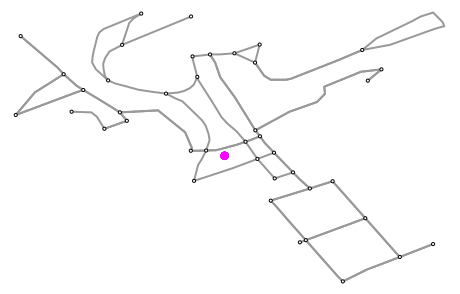

In [ ]:
def plot_graph_with_survey_points(center_point, gdf, dist=70, network_type='all'):
    """
    Create a graph from a center point and plot the road network along with survey points.

    Parameters:
    - center_point: Tuple containing the latitude and longitude of the center point.
    - gdf: GeoDataFrame with 'latitude' and 'longitude' columns for survey points.
    - dist: Distance (in meters) from the center point to consider when creating the graph (default is 70).
    - network_type: Type of network data to download (default is 'all').

    Returns:
    - graph
    """
    # Create a graph from the center point
    graph = ox.graph_from_point(center_point, dist=dist, network_type=network_type)

    # Plot the road network
    fig, ax = ox.plot_graph(graph, node_color='w', node_edgecolor='k', node_size=10, edge_linewidth=2, bgcolor='w', show=False)

    # Plot the survey points location
    gdf.plot(ax=ax, cmap='cool', alpha=0.7, markersize=50, legend=True)

    # Show the plot
    plt.show()

    return graph

#run def
graph = plot_graph_with_survey_points(center_point, ssid_gdf_location1_no_outliers)


/usr/local/lib/python3.10/dist-packages/pandas/core/algorithms.py:522: DeprecationWarning: np.find_common_type is deprecated.  Please use `np.result_type` or `np.promote_types`.
See https://numpy.org/devdocs/release/1.25.0-notes.html and the docs for more information.  (Deprecated NumPy 1.25)
  common = np.find_common_type([values.dtype, comps_array.dtype], [])
/usr/local/lib/python3.10/dist-packages/pandas/core/algorithms.py:522: DeprecationWarning: np.find_common_type is deprecated.  Please use `np.result_type` or `np.promote_types`.
See https://numpy.org/devdocs/release/1.25.0-notes.html and the docs for more information.  (Deprecated NumPy 1.25)
  common = np.find_common_type([values.dtype, comps_array.dtype], [])


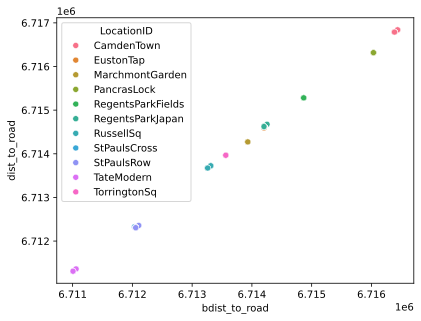

In [ ]:
import seaborn as sns
import matplotlib.pyplot as plt

sns.scatterplot(x=result_gdf['bdist_to_road'] , y=result_gdf['dist_to_road'], hue = result_gdf['LocationID'])
plt.show()


# spearman correlation  distance roads
look at the correlation between the distance to roads and busy roads, to see if there is correlation between them.

## remove outliers in survey points and distance to roads

In [ ]:
def replace_outliers_w_zero_for_distance(gdf, threshold=3, null_object=np.nan):
    """
    Replace outliers in a GeoDataFrame with a null object based on z-scores of latitude and longitude.

    Parameters:
    - gdf: GeoDataFrame with 'latitude' and 'longitude' columns.
    - threshold: Z-score threshold for identifying outliers (default is 3).
    - null_object: Value to replace outliers with (default is np.nan).

    Returns:
    - gdf_no_outliers: GeoDataFrame with outliers replaced by null_object.
    - outliers: DataFrame containing the identified outliers.
    - outliers_count: Number of outliers replaced.
    """
    dist_to_road = gdf['bdist_to_road']

    # Calculate z-scores for latitudes and longitudes
    z_scores = zscore(dist_to_road)

    # Identify outliers based on either latitude or longitude
    outliers_mask = (abs(z_scores) > threshold)

    # Create a copy of the GeoDataFrame to avoid modifying the original data
    gdf_no_outliers = gdf.copy()

    # Replace outliers with null_object
    gdf_no_outliers.loc[outliers_mask, ['bdist_to_road']] = 0

    gdf_no_outliers['outlier_dist'] = outliers_mask

    # Create a DataFrame containing the identified outliers
    outliers = gdf_no_outliers[outliers_mask]

    # Count of outliers replaced
    outliers_count = outliers_mask.sum()

    return gdf_no_outliers, outliers, outliers_count

# ssid_gdf_location1 is your GeoDataFrame
result_gdf_marked_outliers, outliers, outliers_count = replace_outliers_w_zero_for_distance(result_gdf)

# Print the number of outliers removed
print(f"\nNumber of outliers replaced: {outliers_count}")

# Print the outliers
# print("Outliers:")
print(outliers)


Number of outliers replaced: 0
Empty GeoDataFrame
Columns: [LocationID, SessionID, GroupID, RecordID, Language, Lockdown, start_time, end_time, latitude, longitude, Traffic, Other, Human, Natural, ISOPleasant, ISOEventful, PAQ1, PAQ4, PAQ2, PAQ7, PAQ8, PAQ5, PAQ3, PAQ6, Overall, Appropriate, loud, sss04, sss05, who01, who02, who03, who04, who05, WHO_Sum, Age, Gender, occ00___Employed, occ00___Unemployed, occ00___Retired, occ00___Student, occ00___Other, occ00___RatherNotSay, occ00_other, Occupation, edu00, eth00, eth00_other, misc00, misc03, misc03_other, misc04, misc01, use00, uni00, res00___1, res00___2, res00___3, res00___4, res00___5, res02, paper, RecordingLength, Loudness_N5(soneGF), N10_N90(soneGF), Sharpness_S(acum), Rough_HM_R(asper), Rough_HM_Avg,arith(asper), FS_Avg,arith(vacil), I_HM_Avg,arith(iu), Ton_HM_Avg,arith(tuHMS), LZeq_L(dB(SPL)), LAeq_L(A)(dB(SPL)), LA10_LA90(dB(SPL)), LCeq_LAeq(dB(SPL)), LC10_LC90(dB(SPL)), RA_2D_cp(cPa), PA(Zwicker), dataID, geometry, outlier, d

remove outliers in the original outlier column for the survey points and outliers in the distance column

In [ ]:
def remove_outliers(gdf):
    gdf = gdf[gdf['outlier'] != True]
    gdf= gdf



    return gdf

def remove_dist_outliers(gdf):
    gdf = gdf[gdf['outlier_dist'] != True]
    gdf = remove_outliers(gdf)

    return gdf

In [ ]:
result_gdf_marked_outliers.columns

Index(['LocationID', 'SessionID', 'GroupID', 'RecordID', 'Language',
       'Lockdown', 'start_time', 'end_time', 'latitude', 'longitude',
       'Traffic', 'Other', 'Human', 'Natural', 'ISOPleasant', 'ISOEventful',
       'PAQ1', 'PAQ4', 'PAQ2', 'PAQ7', 'PAQ8', 'PAQ5', 'PAQ3', 'PAQ6',
       'Overall', 'Appropriate', 'loud', 'sss04', 'sss05', 'who01', 'who02',
       'who03', 'who04', 'who05', 'WHO_Sum', 'Age', 'Gender',
       'occ00___Employed', 'occ00___Unemployed', 'occ00___Retired',
       'occ00___Student', 'occ00___Other', 'occ00___RatherNotSay',
       'occ00_other', 'Occupation', 'edu00', 'eth00', 'eth00_other', 'misc00',
       'misc03', 'misc03_other', 'misc04', 'misc01', 'use00', 'uni00',
       'res00___1', 'res00___2', 'res00___3', 'res00___4', 'res00___5',
       'res02', 'paper', 'RecordingLength', 'Loudness_N5(soneGF)',
       'N10_N90(soneGF)', 'Sharpness_S(acum)', 'Rough_HM_R(asper)',
       'Rough_HM_Avg,arith(asper)', 'FS_Avg,arith(vacil)',
       'I_HM_Avg,arith(

In [ ]:
#remove outliers rows from gdf
results_gdf_no_outliers = remove_dist_outliers(result_gdf_marked_outliers)
results_gdf_no_outliers = remove_outliers(results_gdf_no_outliers)

#remove rows where LocationID is 'RegentsParkFields'
results_gdf_no_outliers_02 = results_gdf_no_outliers[results_gdf_no_outliers['LocationID'] != 'RegentsParkFields']
location_ids = results_gdf_no_outliers_02['LocationID'].unique()
print(location_ids)


['CamdenTown' 'EustonTap' 'MarchmontGarden' 'PancrasLock'
 'RegentsParkJapan' 'RussellSq' 'StPaulsCross' 'StPaulsRow' 'TateModern'
 'TorringtonSq']


##def spearmanr

In [ ]:

from scipy.stats import spearmanr, pearsonr

def calculate_spearman_correlation(gdf, filters):
    """
    Calculate Spearman correlation matrix and p-values for specified columns in a GeoDataFrame.

    Parameters:
    - gdf: GeoDataFrame with columns for correlation analysis.
    - filters: List of column names to include in the correlation analysis.

    Returns:
    - correlation_df: DataFrame containing the Spearman correlation matrix.
    - p_values_df: DataFrame containing p-values for the correlation.
    """
    # Calculate Spearman correlation matrix and p-values
    gdf = remove_outliers(gdf)

    correlation_matrix, p_values = spearmanr(gdf[filters], nan_policy = 'omit')

    # Create DataFrames for correlation matrix and p-values
    correlation_df = pd.DataFrame(correlation_matrix, columns=filters, index=filters)
    p_values_df = pd.DataFrame(p_values, columns=filters, index=filters)

    return correlation_df, p_values_df


In [ ]:
filters_roads = [ 'ISOPleasant', 'Traffic','bdist_to_road' ]
correlation_df_roads, p_values_df_roads = calculate_spearman_correlation(results_gdf_no_outliers, filters_roads)

In [ ]:
correlation_df_roads, p_values_df_roads

(               ISOPleasant   Traffic  bdist_to_road
 ISOPleasant       1.000000 -0.504036      -0.134611
 Traffic          -0.504036  1.000000       0.104291
 bdist_to_road    -0.134611  0.104291       1.000000,
                 ISOPleasant       Traffic  bdist_to_road
 ISOPleasant    0.000000e+00  2.457510e-73       0.000006
 Traffic        2.457510e-73  0.000000e+00       0.000467
 bdist_to_road  5.995244e-06  4.669868e-04       0.000000)

Text(0.5, 1.0, 'Correlation Heatmap Spearsman distance to  busy roads and ISOPleasant')

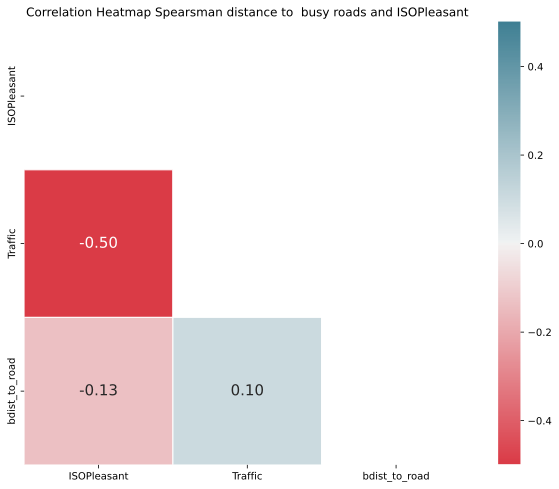

In [ ]:
plt.figure(figsize=(10, 8))

# Generate a mask for the upper triangle; True = do NOT show
mask = np.zeros_like(correlation_df_roads, dtype=bool)
mask[np.triu_indices_from(mask)] = True
sns.heatmap(correlation_df_roads, annot=True, cmap=cmap, mask=mask, fmt='.2f', linewidths=1, vmin = -0.5, vmax = 0.5,  annot_kws={"fontsize": 15})
plt.title("Correlation Heatmap Spearsman distance to  busy roads and ISOPleasant")

spearson correlation matrix
ISOPleasant & dist_to_road:  -0.135293

p values correlation matrix:
ISOPleasant & dist_to_road:  0.000001

because p<0.01 very high predictabilaty

done with z threshold = 2, (with 1 correlation is stronger)



In [ ]:
filters_roads = [ 'ISOPleasant', 'Traffic', 'Natural','bdist_to_road' ]
correlation_df_roads, p_values_df_roads = calculate_spearman_correlation(results_gdf_no_outliers_02, filters_roads)

plt.figure(figsize=(10, 8))

# Generate a mask for the upper triangle; True = do NOT show
mask = np.zeros_like(correlation_df_roads, dtype=bool)
mask[np.triu_indices_from(mask)] = True
sns.heatmap(correlation_df_roads, annot=True, cmap=cmap, mask=mask, fmt='.2f', linewidths=1, vmin = -0.5, vmax = 0.5)
plt.title("Correlation Heatmap Spearsman distance to roads and ISOPleasant")

##partial correlation traffic, isoplesant and bdist_to_road


In [ ]:
partial_corr_result = partial_corr(results_gdf_no_outliers, x = 'bdist_to_road', y = 'ISOPleasant',
                                   covar = 'Traffic', method = 'spearman',
                                   alternative = 'two-sided')

partial_corr_result.round(3)

,n,r,CI95%,p-val
spearman,1122,-0.095,"[-0.15, -0.04]",0.002


In [ ]:
import pandas as pd
from pingouin import partial_corr

def calculate_partial_corr(data, x, y, covar=None, method='spearman', alternative='two-sided'):
    new_var = """
    Calculate partial correlation coefficients.

    Parameters:
    - data: DataFrame
        The DataFrame containing the variables.
    - x: str
        The name of the first variable.
    - y: str
        The name of the second variable.
    - covar: str, optional
        The name of the covariate variable (default=None).
        The name of the covariate variable for y (default=None).
    - method: str, optional
        The correlation method to use (default='spearman').
    - alternative: str, optional
        The alternative hypothesis for the test (default='two-sided').

    Returns:
    - partial_corr_result: DataFrame
        DataFrame containing partial correlation results.
    """
    filters = [x,y]
    # correlation, p_value = spearmanr(data[filters], nan_policy = 'omit')
    correlation_matrix, p_value_matrix = calculate_spearman_correlation(data, filters)
    correlation = correlation_matrix.iloc[1, 0]
    p_value = p_value_matrix.iloc[1, 0]

    data01 = {'n' : 'nan',
            'r': [correlation],
            'CI95%' : 'nan',
            'p-val': [p_value],
            'Type': 'spearman'
            }
    spearman_corr = pd.DataFrame(data01)

    if covar is not None:
        partial_corr_result = partial_corr(data, x=x, y=y, covar=covar, method=method, alternative=alternative)
        partial_corr_result_x = partial_corr(data, x=x, y=y, x_covar=covar, method=method, alternative=alternative)
        partial_corr_result_y = partial_corr(data, x=x, y=y, y_covar=covar, method=method, alternative=alternative)
    else:
        raise ValueError("At least one of covar, x_covar, or y_covar must be specified.")

    # Add "Type" column
    partial_corr_result['Type'] = 'both'
    partial_corr_result_x['Type'] = x
    partial_corr_result_y['Type'] = y
    # print('test1', partial_corr_result_x)
    combined_result = pd.concat([spearman_corr, partial_corr_result, partial_corr_result_x, partial_corr_result_y], axis=0)

    return combined_result

x = 'Traffic'
y = 'ISOPleasant'
covar = 'Natural'


# combined_result   = calculate_partial_corr(results_gdf_no_outliers, x, y, covar=covar)
combined_result   = calculate_partial_corr(result_gdf, x, y, covar=covar)
print(combined_result )

             n         r           CI95%         p-val         Type
0          nan -0.504036             nan  2.457510e-73     spearman
spearman  1122 -0.423809  [-0.47, -0.37]  4.382343e-50         both
spearman  1122 -0.367951  [-0.42, -0.32]  2.888475e-37      Traffic
spearman  1122 -0.402789  [-0.45, -0.35]  5.702920e-45  ISOPleasant


/usr/local/lib/python3.10/dist-packages/pandas/core/dtypes/cast.py:1641: DeprecationWarning: np.find_common_type is deprecated.  Please use `np.result_type` or `np.promote_types`.
See https://numpy.org/devdocs/release/1.25.0-notes.html and the docs for more information.  (Deprecated NumPy 1.25)
  return np.find_common_type(types, [])


In [ ]:
x = 'ISOPleasant'
y = 'bdist_to_road'
covar = 'Traffic'

combined_result   = calculate_partial_corr(results_gdf_no_outliers, x, y, covar=covar)
print(combined_result )

             n         r          CI95%     p-val           Type
0          nan  0.133270            nan  0.000012       spearman
spearman  1073  0.002267  [-0.06, 0.06]  0.940909           both
spearman  1073  0.002159  [-0.06, 0.06]  0.943706    ISOPleasant
spearman  1073  0.002046  [-0.06, 0.06]  0.946654  bdist_to_road


In [ ]:
x = 'ISOPleasant'
y = 'bdist_to_road'
covar = 'Traffic'

combined_result   = calculate_partial_corr(results_gdf_no_outliers, x, y, covar=covar)
print(combined_result )

             n         r           CI95%         p-val           Type
0          nan -0.184069             nan  5.143145e-10       spearman
spearman  1122 -0.130749  [-0.19, -0.07]  1.125036e-05           both
spearman  1122 -0.129420  [-0.19, -0.07]  1.382463e-05    ISOPleasant
spearman  1122 -0.112926  [-0.17, -0.05]  1.513716e-04  bdist_to_road


/usr/local/lib/python3.10/dist-packages/pandas/core/dtypes/cast.py:1641: DeprecationWarning: np.find_common_type is deprecated.  Please use `np.result_type` or `np.promote_types`.
See https://numpy.org/devdocs/release/1.25.0-notes.html and the docs for more information.  (Deprecated NumPy 1.25)
  return np.find_common_type(types, [])


In [ ]:
x = 'ISOPleasant'
y = 'bdist_to_road'
covar = 'Traffic'

combined_result   = calculate_partial_corr(results_gdf_no_outliers, x, y, covar=covar)
print(combined_result )

             n         r           CI95%     p-val           Type
0          nan -0.134611             nan  0.000006       spearman
spearman  1122 -0.094708  [-0.15, -0.04]  0.001501           both
spearman  1122 -0.094191  [-0.15, -0.04]  0.001593    ISOPleasant
spearman  1122 -0.081797  [-0.14, -0.02]  0.006140  bdist_to_road


/usr/local/lib/python3.10/dist-packages/pandas/core/dtypes/cast.py:1641: DeprecationWarning: np.find_common_type is deprecated.  Please use `np.result_type` or `np.promote_types`.
See https://numpy.org/devdocs/release/1.25.0-notes.html and the docs for more information.  (Deprecated NumPy 1.25)
  return np.find_common_type(types, [])


In [ ]:
x = 'bdist_to_road'
y = 'ISOPleasant'
covar = 'N10_N90(soneGF)'

combined_result   = calculate_partial_corr(results_gdf_no_outliers, x, y, covar=covar)
print(combined_result )

            n         r         CI95%     p-val           Type
0         nan  0.133270           nan  0.000012       spearman
spearman  936  0.106720  [0.04, 0.17]  0.001082           both
spearman  936  0.095011  [0.03, 0.16]  0.003638  bdist_to_road
spearman  936  0.106509  [0.04, 0.17]  0.001107    ISOPleasant


## linear regression model

In [ ]:
import pandas as pd
from rpy2.robjects import pandas2ri
from rpy2.robjects.packages import importr
from rpy2.robjects import r, Formula

results_gdf_no_outliers_02_r = results_gdf_no_outliers_02[['ISOPleasant','Traffic', 'Natural']]

# Convert pandas DataFrame to R DataFrame
pandas2ri.activate()
results_gdf_no_outliers_02_r = pandas2ri.DataFrame(results_gdf_no_outliers_02_r)

# Load required R packages
base = importr('base')
stats = importr('stats')

# Define the formula for multiple linear regression
formula = Formula('ISOPleasant ~ Traffic + Natural')

# Fit the multiple linear regression model
lm_model = stats.lm(formula, data=results_gdf_no_outliers_02_r)

# Print summary of the model
print(base.summary(lm_model))


<frozen importlib._bootstrap>:914: ImportWarning: _PyDrive2ImportHook.find_spec() not found; falling back to find_module()
<frozen importlib._bootstrap>:914: ImportWarning: _PyDriveImportHook.find_spec() not found; falling back to find_module()
<frozen importlib._bootstrap>:914: ImportWarning: _GenerativeAIImportHook.find_spec() not found; falling back to find_module()
<frozen importlib._bootstrap>:914: ImportWarning: _OpenCVImportHook.find_spec() not found; falling back to find_module()
<frozen importlib._bootstrap>:914: ImportWarning: APICoreClientInfoImportHook.find_spec() not found; falling back to find_module()
<frozen importlib._bootstrap>:914: ImportWarning: _BokehImportHook.find_spec() not found; falling back to find_module()
<frozen importlib._bootstrap>:914: ImportWarning: _AltairImportHook.find_spec() not found; falling back to find_module()
<frozen importlib._bootstrap>:914: ImportWarning: _PyDrive2ImportHook.find_spec() not found; falling back to find_module()
<frozen impo


Call:
(function (formula, data, subset, weights, na.action, method = "qr", 
    model = TRUE, x = FALSE, y = FALSE, qr = TRUE, singular.ok = TRUE, 
    contrasts = NULL, offset, ...) 
{
    ret.x <- x
    ret.y <- y
    cl <- match.call()
    mf <- match.call(expand.dots = FALSE)
    m <- match(c("formula", "data", "subset", "weights", "na.action", 
        "offset"), names(mf), 0L)
    mf <- mf[c(1L, m)]
    mf$drop.unused.levels <- TRUE
    mf[[1L]] <- quote(stats::model.frame)
    mf <- eval(mf, parent.frame())
    if (method == "model.frame") 
        return(mf)
    else if (method != "qr") 
        warning(gettextf("method = '%s' is not supported. Using 'qr'", 
            method), domain = NA)
    mt <- attr(mf, "terms")
    y <- model.response(mf, "numeric")
    w <- as.vector(model.weights(mf))
    if (!is.null(w) && !is.numeric(w)) 
        stop("'weights' must be a numeric vector")
    offset <- model.offset(mf)
    mlm <- is.matrix(y)
    ny <- if (mlm) 
        nrow(y)
   

ISOPleasant = 0.477 - 0.09 * Traffic + 0.115 * Natural - 0.08 * Other sounds - 0.03 * Human sounds

ISOPLeasant = 0.30 - 0.12 * Traffic + 0.12 * Natural

Residual standard error: 0.3356 on 1147 degrees of freedom
  (1 observation deleted due to missingness)

Multiple R-squared:  0.3031,	Adjusted R-squared:  0.3018

F-statistic: 249.4 on 2 and 1147 DF,  p-value: < 2.2e-16

In [ ]:
import pandas as pd
from rpy2.robjects import pandas2ri
from rpy2.robjects.packages import importr
from rpy2.robjects import r, Formula


results_gdf_no_outliers_02_r = ssid[['ISOPleasant','Traffic', 'Natural']]

# Convert pandas DataFrame to R DataFrame
pandas2ri.activate()
results_gdf_no_outliers_02_r = pandas2ri.DataFrame(results_gdf_no_outliers_02_r)

# Load required R packages
base = importr('base')
stats = importr('stats')

# Define the formula for multiple linear regression
formula = Formula('ISOPleasant ~ Traffic + Natural')

# Fit the multiple linear regression model
lm_model = stats.lm(formula, data=results_gdf_no_outliers_02_r)

# Print summary of the model
print(base.summary(lm_model))


/usr/local/lib/python3.10/dist-packages/rpy2/robjects/pandas2ri.py:261: DeprecationWarning: The global conversion available with activate() is deprecated and will be removed in the next major release. Use a local converter.
  warnings.warn('The global conversion available with activate() '



Call:
(function (formula, data, subset, weights, na.action, method = "qr", 
    model = TRUE, x = FALSE, y = FALSE, qr = TRUE, singular.ok = TRUE, 
    contrasts = NULL, offset, ...) 
{
    ret.x <- x
    ret.y <- y
    cl <- match.call()
    mf <- match.call(expand.dots = FALSE)
    m <- match(c("formula", "data", "subset", "weights", "na.action", 
        "offset"), names(mf), 0L)
    mf <- mf[c(1L, m)]
    mf$drop.unused.levels <- TRUE
    mf[[1L]] <- quote(stats::model.frame)
    mf <- eval(mf, parent.frame())
    if (method == "model.frame") 
        return(mf)
    else if (method != "qr") 
        warning(gettextf("method = '%s' is not supported. Using 'qr'", 
            method), domain = NA)
    mt <- attr(mf, "terms")
    y <- model.response(mf, "numeric")
    w <- as.vector(model.weights(mf))
    if (!is.null(w) && !is.numeric(w)) 
        stop("'weights' must be a numeric vector")
    offset <- model.offset(mf)
    mlm <- is.matrix(y)
    ny <- if (mlm) 
        nrow(y)
   

ISOPL = 0.32 - 0.13 * Traffic + 0.12 * Natural

Multiple R-squared:  0.3169,	Adjusted R-squared:  0.3158

# Add nature

In [ ]:
# ssid_gdf_location1 is your GeoDataFrame
# selecting only rows for filtered location (here location 1)
filter_location =['EustonTap']
ssid_gdf_location2 = ssid_gdf.loc[ssid['LocationID'].isin(filter_location)]
ssid_gdf_location2.tail()
ssid_gdf_location2_no_outliers, outliers, outliers_count = replace_outliers_w_zero(ssid_gdf_location2)
center_point = calculate_center_point(ssid_gdf_location2_no_outliers)

tags_natural = {'natural':[ 'grassland','water' ] }
tags_landuse = {'landuse':[ 'grass','greenfield']}
tags_parks = {'leisure':[ 'nature_reserve','park', 'track' ]}
tags_tree = {'natural':[ 'grassland', 'tree', 'wood'] }

print(center_point)

(51.5269, -0.1323)


In [ ]:
def load_osm_data(point, tags, size):
    warnings.filterwarnings("ignore", category=DeprecationWarning)
    try:
        data = ox.features_from_point(point, tags, dist=size)
        return data
    except Exception as e:
        print(f'Error loading {tags} data: {e}')
        return None
    warnings.resetwarnings()


#load vegetation
landuse_natural = load_osm_data(center_point, tags_landuse, size = 200 )
park_natural = load_osm_data(center_point, tags_parks, size = 300 )
vegetation_natural = load_osm_data(center_point, tags_tree, size = 300 )


In [ ]:
from shapely.ops import nearest_points

def calculate_distances_to_natural_elements(locations_gdf, park_natural, vegetation_natural):
    # Define a function to calculate distance to the nearest natural element
    def calculate_distance_to_nearest(point, natural_element):
        nearest_point = nearest_points(point, natural_element.unary_union)[1]
        return point.distance(nearest_point)

    # Create new columns in locations_gdf to store the distances to different natural elements
    locations_gdf['distance_to_park'] = None
    locations_gdf['distance_to_vegetation'] = None

   # Handle the case where park_natural is None, perhaps by returning an empty GeoDataFrame or raising an exceptio
    if park_natural is None:
        locations_gdf['distance_to_park'] = 10
    else:
        # Iterate through each point in locations_gdf and calculate distance to the nearest park
        for index, row in locations_gdf.iterrows():
            point = row['geometry']
            locations_gdf.at[index, 'distance_to_park'] = calculate_distance_to_nearest(point, park_natural)

    # Check if vegetation_natural is empty, if empty, set distance_to_vegetation to a large value (e.g., 10)
    if vegetation_natural is None:
        locations_gdf['distance_to_vegetation'] = 10
    else:
        # Iterate through each point in locations_gdf and calculate distance to the nearest vegetation
        for index, row in locations_gdf.iterrows():
            point = row['geometry']
            locations_gdf.at[index, 'distance_to_vegetation'] = calculate_distance_to_nearest(point, vegetation_natural)

    # Add a column for the smallest distance to vegetation
    for index, row in locations_gdf.iterrows():
        dist_park = row['distance_to_park']
        distance_vegetation = row['distance_to_vegetation']
        if dist_park > distance_vegetation:
            dist_veg = distance_vegetation
        else:
            dist_veg = dist_park

        # add the smallest value to the column dist_veg
        locations_gdf.at[index, 'dist_veg'] = dist_veg

    # locations_gdf['dist_veg'] = locations_gdf[['distance_to_park', 'distance_to_vegetation']].max(axis=1)
    return locations_gdf



# Call the function to calculate distances
gdf_green_loc1 = calculate_distances_to_natural_elements(ssid_gdf_location2, park_natural, vegetation_natural)
print(gdf_green_loc1[['geometry', 'distance_to_park', 'distance_to_vegetation', 'dist_veg']])

                      geometry distance_to_park distance_to_vegetation  \
150  POINT (-0.13230 51.52690)         0.001944               0.000304   
151  POINT (-0.13230 51.52690)         0.001944               0.000304   
153  POINT (-0.13230 51.52690)         0.001944               0.000304   
154  POINT (-0.13230 51.52690)         0.001944               0.000304   
155  POINT (-0.13230 51.52690)         0.001944               0.000304   
..                         ...              ...                    ...   
250  POINT (-0.13230 51.52690)         0.001944               0.000304   
251  POINT (-0.13230 51.52690)         0.001944               0.000304   
252  POINT (-0.13230 51.52690)         0.001944               0.000304   
253  POINT (-0.13230 51.52690)         0.001944               0.000304   
254  POINT (-0.13230 51.52690)         0.001944               0.000304   

     dist_veg  
150  0.000304  
151  0.000304  
153  0.000304  
154  0.000304  
155  0.000304  
..        ...  

/usr/local/lib/python3.10/dist-packages/geopandas/geodataframe.py:1538: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  super().__setitem__(key, value)
/usr/local/lib/python3.10/dist-packages/geopandas/geodataframe.py:1538: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  super().__setitem__(key, value)
/usr/local/lib/python3.10/dist-packages/geopandas/geodataframe.py:1538: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value 

##def process_gdf_distance_green


In [ ]:
def process_gdf_distance_green(geodataframe_location, size_graph = 100, network_type ="all" ):
    """
    Add distance to nearest green to a GeoDataFrame.

    Parameters:
    - geodataframe_location (gpd.GeoDataFrame): Input GeoDataFrame containing location data.

    Returns:
    - gpd.GeoDataFrame: GeoDataFrame with added distance to nearest vegetation.
    """
    # Step 1: Remove outliers
    cluster_gdf_no_outliers, outliers, outliers_count = replace_outliers_w_zero(geodataframe_location)

    # Step 2: Calculate center point
    center_point = calculate_center_point(cluster_gdf_no_outliers)

    # Step 3 load in the vegatation
    landuse_natural = load_osm_data(center_point, tags_landuse, size = size_graph )
    park_natural = load_osm_data(center_point, tags_parks, size = size_graph )
    vegetation_natural = load_osm_data(center_point, tags_tree, size = size_graph )

    # # Step 4: Calculate distance to nearest vegetation
    add_dist_green_gdf_final = calculate_distances_to_natural_elements(geodataframe_location, park_natural, vegetation_natural)

    return add_dist_green_gdf_final

add_dist_green_gdf =process_gdf_distance_green(ssid_gdf_location2)



Error loading {'leisure': ['nature_reserve', 'park', 'track']} data: No data elements in server response. Check log and query location/tags.


/usr/local/lib/python3.10/dist-packages/geopandas/geodataframe.py:1538: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  super().__setitem__(key, value)


In [ ]:
add_dist_green_gdf[['geometry', 'distance_to_park', 'distance_to_vegetation', 'dist_veg']]

,geometry,distance_to_park,distance_to_vegetation,dist_veg
150,POINT (-0.13230 51.52690),10,0.000304,0.000304
151,POINT (-0.13230 51.52690),10,0.000304,0.000304
153,POINT (-0.13230 51.52690),10,0.000304,0.000304
154,POINT (-0.13230 51.52690),10,0.000304,0.000304
155,POINT (-0.13230 51.52690),10,0.000304,0.000304
...,...,...,...,...
250,POINT (-0.13230 51.52690),10,0.000304,0.000304
251,POINT (-0.13230 51.52690),10,0.000304,0.000304
252,POINT (-0.13230 51.52690),10,0.000304,0.000304
253,POINT (-0.13230 51.52690),10,0.000304,0.000304


## run it for all locations

In [ ]:
#Create a list to store green_gdf DataFrames
green_gdfs = []

#Iterate through unique LocationIDs and create separate green_gdf for each LocationID
for location_id, group in ssid_gdf.groupby('LocationID'):
  print('calculating for', location_id)
  green_gdf = process_gdf_distance_green(group, size_graph = 200)
  green_gdfs.append(green_gdf)

calculating for CamdenTown
calculating for EustonTap
calculating for MarchmontGarden
Error loading {'landuse': ['grass', 'greenfield']} data: No data elements in server response. Check log and query location/tags.
calculating for MonumentoGaribaldi
calculating for PancrasLock
calculating for RegentsParkFields
Error loading {'landuse': ['grass', 'greenfield']} data: No data elements in server response. Check log and query location/tags.
calculating for RegentsParkJapan
calculating for RussellSq
calculating for SanMarco
Error loading {'landuse': ['grass', 'greenfield']} data: No data elements in server response. Check log and query location/tags.
calculating for StPaulsCross
calculating for StPaulsRow
calculating for TateModern
calculating for TorringtonSq


##joining the green gdfs

In [ ]:
# Step 4: Concatenate the cluster_gdfs list into a single DataFrame
green_gdf_results = pd.concat(green_gdfs, ignore_index=False)

#join the 'dist_veg column with the result_gdf
result_gdf_w_green = pd.merge(result_gdf, green_gdf_results['dist_veg'], how='left', left_index=True, right_index=True)

In [ ]:
result_gdf_w_green.columns
# result_gdf_w_green.tail()

Index(['LocationID', 'SessionID', 'GroupID', 'RecordID', 'Language',
       'Lockdown', 'start_time', 'end_time', 'latitude', 'longitude',
       'Traffic', 'Other', 'Human', 'Natural', 'ISOPleasant', 'ISOEventful',
       'pleasant', 'chaotic', 'vibrant', 'uneventful', 'calm', 'annoying',
       'eventful', 'monotonous', 'Overall', 'Appropriate', 'loud', 'sss04',
       'sss05', 'who01', 'who02', 'who03', 'who04', 'who05', 'WHO_Sum', 'Age',
       'Gender', 'occ00___Employed', 'occ00___Unemployed', 'occ00___Retired',
       'occ00___Student', 'occ00___Other', 'occ00___RatherNotSay',
       'occ00_other', 'Occupation', 'edu00', 'eth00', 'eth00_other', 'misc00',
       'misc03', 'misc03_other', 'misc04', 'misc01', 'use00', 'uni00',
       'res00___1', 'res00___2', 'res00___3', 'res00___4', 'res00___5',
       'res02', 'paper', 'RecordingLength', 'Loudness_N5(soneGF)',
       'N10_N90(soneGF)', 'Sharpness_S(acum)', 'Rough_HM_R(asper)',
       'Rough_HM_Avg,arith(asper)', 'FS_Avg,arith(va

### plotting


/usr/local/lib/python3.10/dist-packages/pandas/core/dtypes/cast.py:1641: DeprecationWarning: np.find_common_type is deprecated.  Please use `np.result_type` or `np.promote_types`.
See https://numpy.org/devdocs/release/1.25.0-notes.html and the docs for more information.  (Deprecated NumPy 1.25)
  return np.find_common_type(types, [])
/usr/local/lib/python3.10/dist-packages/pandas/core/dtypes/cast.py:1641: DeprecationWarning: np.find_common_type is deprecated.  Please use `np.result_type` or `np.promote_types`.
See https://numpy.org/devdocs/release/1.25.0-notes.html and the docs for more information.  (Deprecated NumPy 1.25)
  return np.find_common_type(types, [])
/usr/local/lib/python3.10/dist-packages/pandas/core/dtypes/cast.py:1641: DeprecationWarning: np.find_common_type is deprecated.  Please use `np.result_type` or `np.promote_types`.
See https://numpy.org/devdocs/release/1.25.0-notes.html and the docs for more information.  (Deprecated NumPy 1.25)
  return np.find_common_type(typ

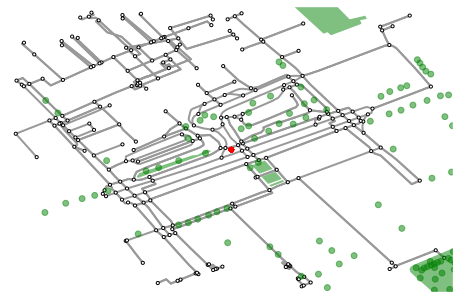

In [ ]:
def plot_green_with_survey_points(center_point, gdf, green, trees,  dist=70, network_type='all'):
    """
    Create a graph from a center point and plot the road network along with survey points.

    Parameters:
    - center_point: Tuple containing the latitude and longitude of the center point.
    - gdf: GeoDataFrame with 'latitude' and 'longitude' columns for survey points.
    - dist: Distance (in meters) from the center point to consider when creating the graph (default is 70).
    - network_type: Type of network data to download (default is 'all').

    Returns:
    - graph
    """
    # Create a graph from the center point
    graph = ox.graph_from_point(center_point, dist=dist, network_type=network_type)


    # Plot the road network
    fig, ax = ox.plot_graph(graph, node_color='w', node_edgecolor='k', node_size=10, edge_linewidth=2, bgcolor='w', show=False)

    for i in green:
          i.plot(ax=ax, color = 'green', alpha = 0.5)
    trees.plot(ax=ax, color = 'green', alpha = 0.5)

    # Plot the survey points location
    gdf.plot(ax=ax, color='red', alpha=0.7, markersize=20)

    # Show the plot
    plt.show()

    return graph

#run def
graph = plot_green_with_survey_points(center_point, gdf = ssid_gdf_location2_no_outliers, green =  [landuse_natural, park_natural],
                                      trees = vegetation_natural,  dist = 200)

In [ ]:
# #Iterate through unique LocationIDs and create separate green_gdf for each LocationID
# size_graph = 200
# for location_id, group in result_gdf.groupby('LocationID'):
#   print('calculating for', location_id)
#       # Step 1: Remove outliers
#   cluster_gdf_no_outliers, outliers, outliers_count = replace_outliers_w_zero(group)

#     # Step 2: Calculate center point
#   center_point = calculate_center_point(group)

#     # Step 3 load in the vegatation
#   landuse_natural = load_osm_data(center_point, tags_landuse, size = size_graph )
#   park_natural = load_osm_data(center_point, tags_parks, size = size_graph )
#   vegetation_natural = load_osm_data(center_point, tags_tree, size = size_graph )
#   graph = plot_green_with_survey_points(center_point, gdf = group, green =  [landuse_natural, park_natural],
#                                       trees = vegetation_natural,  dist = 200 )
#   # green_gdfs.append(green_gdf)

/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


## spearman correlation for vegetation


In [ ]:
def replace_outliers_w_zero_2(gdf, threshold=3, null_object=np.nan, column = 'latitude'):
    """
    Replace outliers in a GeoDataFrame with a null object based on z-scores of latitude and longitude.

    Parameters:
    - gdf: GeoDataFrame with 'latitude' and 'longitude' columns.
    - threshold: Z-score threshold for identifying outliers (default is 3).
    - null_object: Value to replace outliers with (default is np.nan).
    - column = the column to calculate the outliers for (default is'latitude')

    Returns:
    - gdf_no_outliers: GeoDataFrame with outliers replaced by null_object.
    - outliers: DataFrame containing the identified outliers.
    - outliers_count: Number of outliers replaced.
    """
    dist_to_veg = gdf[column]

    # Calculate z-scores for latitudes and longitudes
    z_scores = zscore(dist_to_veg)

    # Identify outliers based on either latitude or longitude
    outliers_mask = (abs(z_scores) > threshold)

    # Create a copy of the GeoDataFrame to avoid modifying the original data
    gdf_no_outliers = gdf.copy()

    # Replace outliers with null_object
    gdf_no_outliers.loc[outliers_mask, [column]] = 0

    #create aniew column with the outlier mask
    column_outlier = column + '_outlier'  # Append '_outlier' to the existing column name
    gdf_no_outliers[column_outlier] = outliers_mask

    # Create a DataFrame containing the identified outliers
    outliers = gdf_no_outliers[outliers_mask]

    # Count of outliers replaced
    outliers_count = outliers_mask.sum()

    return gdf_no_outliers, outliers, outliers_count

def remove_outliers(gdf, column='outlier'):
    gdf = gdf[gdf[column] != True]
    gdf=gdf
    return gdf

In [ ]:
filters_green = [ 'ISOPleasant',  'Natural', 'Traffic','dist_veg' ]

#remove outliers with distance in the dist_veg column
result_gdf_w_green_marked_outliers, outliers, outliers_count = replace_outliers_w_zero_2(result_gdf_w_green,
                                                                                         column = 'dist_veg')
result_gdf_w_green_no_outliers = remove_outliers(result_gdf_w_green_marked_outliers, column = 'dist_veg_outlier')

# Print the number of outliers removed
print(f"\nNumber of outliers replaced: {outliers_count}")

# Print the outliers
# print("Outliers:")
# print(outliers)

# result_gdf_w_green_no_outliers
correlation_df_green, p_values_df_green = calculate_spearman_correlation(result_gdf_w_green_no_outliers, filters_green)
# correlation_df_green, p_values_df_green = calculate_spearman_correlation(result_gdf_w_green, filters_green)


Number of outliers replaced: 25


In [ ]:
p_values_df_green

,ISOPleasant,Natural,Traffic,dist_veg
ISOPleasant,0.000000e+00,9.873402e-60,1.252648e-49,2.851185e-38
Natural,9.873402e-60,0.000000e+00,1.993944e-20,1.233649e-44
Traffic,1.252648e-49,1.993944e-20,0.000000e+00,5.171897e-02
dist_veg,2.851185e-38,1.233649e-44,5.171897e-02,0.000000e+00


In [ ]:
correlation_df_green

,ISOPleasant,Natural,Traffic,dist_veg
ISOPleasant,1.000000,0.468815,-0.430435,-0.380225
Natural,0.468815,1.000000,-0.277523,-0.409474
Traffic,-0.430435,-0.277523,1.000000,0.059408
dist_veg,-0.380225,-0.409474,0.059408,1.000000


Text(0.5, 1.0, 'Correlation Heatmap Spearsman distance to vegeation and ISOPleasant')

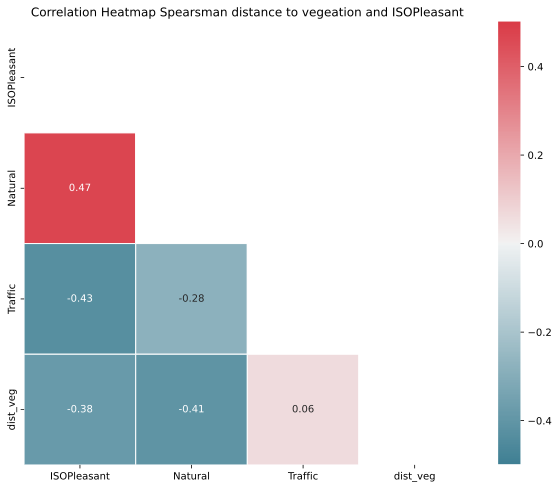

In [ ]:
plt.figure(figsize=(10, 8))

# Generate a mask for the upper triangle; True = do NOT show
mask = np.zeros_like(correlation_df_green, dtype=bool)
mask[np.triu_indices_from(mask)] = True
sns.heatmap(correlation_df_green, annot=True, cmap=cmap, mask=mask, fmt='.2f', linewidths=1, vmin = -0.5, vmax = 0.5)
plt.title("Correlation Heatmap Spearsman distance to vegeation and ISOPleasant")

In [ ]:
# # saving the dataframe
# result_gdf_w_green.to_csv('ssid_gdf_raods_vegetation.csv')
# result_gdf_w_green


In [ ]:
# sns.histplot(data=result_gdf_w_green, x='dist_veg', bins = 50, hue='LocationID', multiple= 'layer')#,  element="bars", stat='count', multiple= 'dodge', kde=True)
# plt.show()

In [ ]:
locations = result_gdf_w_green_no_outliers_03['LocationID'].unique()
print(locations)

['CamdenTown' 'EustonTap' 'MarchmontGarden' 'MonumentoGaribaldi'
 'PancrasLock' 'RegentsParkJapan' 'RussellSq' 'SanMarco' 'StPaulsCross'
 'StPaulsRow' 'TateModern' 'TorringtonSq']


/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


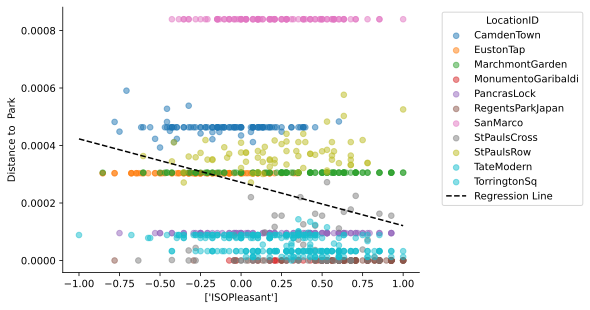

In [ ]:
from matplotlib import pyplot as plt

#remove rows where LocationID is 'RegentsParkFields'
result_gdf_w_green_no_outliers_03 = result_gdf_w_green_no_outliers[result_gdf_w_green_no_outliers['LocationID'] != 'RegentsParkFields']
# result_gdf_w_green_no_outliers_03 = result_gdf_w_green_no_outliers_03[result_gdf_w_green_no_outliers_03['LocationID'] != 'SanMarco']
result_gdf_w_green_no_outliers_03 = result_gdf_w_green_no_outliers_03[result_gdf_w_green_no_outliers_03['LocationID'] != 'RussellSq']

locations = result_gdf_w_green_no_outliers_03['LocationID'].unique()
# colors = plt.cm.viridis(np.linspace(0, 1, len(locations)))
colors = plt.cm.tab10(np.linspace(0, 1, len(locations)))

scatter_column1 = ['ISOPleasant']

fig, ax = plt.subplots()
for i, loc in enumerate(locations):
    subset = result_gdf_w_green_no_outliers_03[result_gdf_w_green_no_outliers_03['LocationID'] == loc]
    ax.scatter(subset[scatter_column1], subset['dist_veg'], label=loc, color=colors[i], s=32, alpha=.5)

plt.gca().spines[['top', 'right']].set_visible(False)

# Add labels to the axes
plt.xlabel(scatter_column1)
plt.ylabel('Distance to  Park')

# Fit a linear regression model
slope, intercept, r_value, p_value, std_err = stats.linregress(result_gdf_w_green_no_outliers_03['ISOPleasant'], result_gdf_w_green_no_outliers_03['dist_veg'])

# Plot the regression line
x = np.array([results_gdf_no_outliers_02[scatter_column1].min(), results_gdf_no_outliers_02[scatter_column1].max()])
y = slope * x + intercept
plt.plot(x, y, color='black', linestyle='--', label='Regression Line')

# Add legend
plt.legend(title='LocationID', bbox_to_anchor=(1.05, 1), loc='upper left')

plt.show()

/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


Text(0.5, 1.0, 'Correlation Heatmap Spearsman distance to vegeation and ISOPleasant')

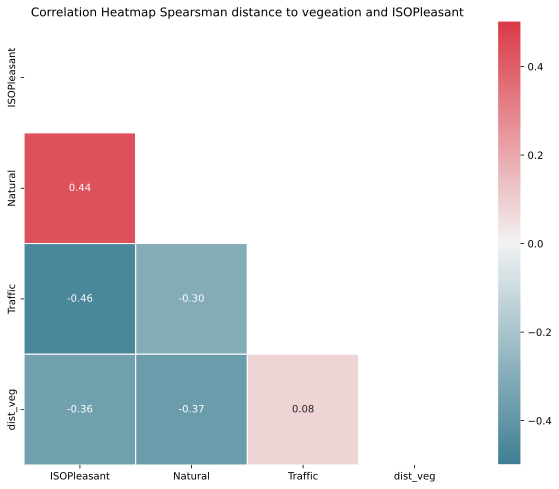

In [ ]:
correlation_df_green, p_values_df_green = calculate_spearman_correlation(result_gdf_w_green_no_outliers_03, filters_green)
plt.figure(figsize=(10, 8))

# Generate a mask for the upper triangle; True = do NOT show
mask = np.zeros_like(correlation_df_green, dtype=bool)
mask[np.triu_indices_from(mask)] = True
sns.heatmap(correlation_df_green, annot=True, cmap=cmap, mask=mask, fmt='.2f', linewidths=1, vmin = -0.5, vmax = 0.5)
plt.title("Correlation Heatmap Spearsman distance to vegeation and ISOPleasant")

### linear model

In [ ]:
import pandas as pd
from rpy2.robjects import pandas2ri
from rpy2.robjects.packages import importr
from rpy2.robjects import r, Formula

results_gdf_no_outliers_02_r = result_gdf_w_green[['ISOPleasant', 'dist_veg']]

# Convert pandas DataFrame to R DataFrame
pandas2ri.activate()
results_gdf_no_outliers_02_r = pandas2ri.DataFrame(results_gdf_no_outliers_02_r)

# Load required R packages
base = importr('base')
stats = importr('stats')

# Define the formula for multiple linear regression
formula = Formula('ISOPleasant ~  dist_veg')

# Fit the multiple linear regression model
lm_model = stats.lm(formula, data=results_gdf_no_outliers_02_r)

# Print summary of the model
print(base.summary(lm_model))

/usr/local/lib/python3.10/dist-packages/rpy2/robjects/pandas2ri.py:261: DeprecationWarning: The global conversion available with activate() is deprecated and will be removed in the next major release. Use a local converter.
  warnings.warn('The global conversion available with activate() '



Call:
(function (formula, data, subset, weights, na.action, method = "qr", 
    model = TRUE, x = FALSE, y = FALSE, qr = TRUE, singular.ok = TRUE, 
    contrasts = NULL, offset, ...) 
{
    ret.x <- x
    ret.y <- y
    cl <- match.call()
    mf <- match.call(expand.dots = FALSE)
    m <- match(c("formula", "data", "subset", "weights", "na.action", 
        "offset"), names(mf), 0L)
    mf <- mf[c(1L, m)]
    mf$drop.unused.levels <- TRUE
    mf[[1L]] <- quote(stats::model.frame)
    mf <- eval(mf, parent.frame())
    if (method == "model.frame") 
        return(mf)
    else if (method != "qr") 
        warning(gettextf("method = '%s' is not supported. Using 'qr'", 
            method), domain = NA)
    mt <- attr(mf, "terms")
    y <- model.response(mf, "numeric")
    w <- as.vector(model.weights(mf))
    if (!is.null(w) && !is.numeric(w)) 
        stop("'weights' must be a numeric vector")
    offset <- model.offset(mf)
    mlm <- is.matrix(y)
    ny <- if (mlm) 
        nrow(y)
   

### partial correlation


In [ ]:
x = 'dist_veg'
y = 'ISOPleasant'
covar = 'Natural'

# results_gdf_no_outliers_02_r = result_gdf_w_green[['ISOPleasant', 'dist_veg']]
# result_gdf_w_green

# combined_result   = calculate_partial_corr(result_gdf_w_green, x, y, covar=covar)
combined_result   = calculate_partial_corr(result_gdf_w_green_no_outliers, x, y, covar=covar)

print(combined_result)

             n         r           CI95%         p-val         Type
0          nan -0.380225             nan  2.851185e-38     spearman
spearman  1276 -0.191881  [-0.24, -0.14]  4.877800e-12         both
spearman  1276 -0.171223  [-0.22, -0.12]  7.584944e-10     dist_veg
spearman  1276 -0.177773  [-0.23, -0.12]  1.631838e-10  ISOPleasant


/usr/local/lib/python3.10/dist-packages/pandas/core/dtypes/cast.py:1641: DeprecationWarning: np.find_common_type is deprecated.  Please use `np.result_type` or `np.promote_types`.
See https://numpy.org/devdocs/release/1.25.0-notes.html and the docs for more information.  (Deprecated NumPy 1.25)
  return np.find_common_type(types, [])


In [ ]:
x = 'Natural'
y = 'ISOPleasant'
covar = 'dist_veg'

# results_gdf_no_outliers_02_r = result_gdf_w_green[['ISOPleasant', 'dist_veg']]
#
# combined_result   = calculate_partial_corr(result_gdf_w_green, x, y, covar=covar)
combined_result   = calculate_partial_corr(result_gdf_w_green_no_outliers, x, y, covar=covar)

combined_result

/usr/local/lib/python3.10/dist-packages/pandas/core/dtypes/cast.py:1641: DeprecationWarning: np.find_common_type is deprecated.  Please use `np.result_type` or `np.promote_types`.
See https://numpy.org/devdocs/release/1.25.0-notes.html and the docs for more information.  (Deprecated NumPy 1.25)
  return np.find_common_type(types, [])


,n,r,CI95%,p-val,Type
0,nan,0.468815,nan,9.873402e-60,spearman
spearman,1276,0.374521,"[0.33, 0.42]",9.922093e-44,both
spearman,1276,0.353736,"[0.3, 0.4]",7.010755e-39,Natural
spearman,1276,0.346985,"[0.3, 0.39]",2.211901e-37,ISOPleasant


In [ ]:
x = 'dist_veg'
y = 'Natural'
covar = 'ISOPleasant'

# results_gdf_no_outliers_02_r = result_gdf_w_green[['ISOPleasant', 'dist_veg']]
#
# combined_result   = calculate_partial_corr(result_gdf_w_green, x, y, covar=covar)
combined_result   = calculate_partial_corr(result_gdf_w_green_no_outliers, x, y, covar=covar)

combined_result

/usr/local/lib/python3.10/dist-packages/pandas/core/dtypes/cast.py:1641: DeprecationWarning: np.find_common_type is deprecated.  Please use `np.result_type` or `np.promote_types`.
See https://numpy.org/devdocs/release/1.25.0-notes.html and the docs for more information.  (Deprecated NumPy 1.25)
  return np.find_common_type(types, [])


,n,r,CI95%,p-val,Type
0,nan,-0.409474,nan,1.233649e-44,spearman
spearman,1276,-0.270617,"[-0.32, -0.22]",7.753405e-23,both
spearman,1276,-0.241482,"[-0.29, -0.19]",2.251858e-18,dist_veg
spearman,1276,-0.255598,"[-0.31, -0.2]",1.824083e-20,Natural


In [ ]:

partial_corr_result = partial_corr(result_gdf_w_green, x = 'ISOPleasant', y = 'Traffic',
                                   covar = 'dist_veg', method = 'spearman',
                                   alternative = 'two-sided')

partial_corr_result.round(3)

,n,r,CI95%,p-val
spearman,1301,-0.45,"[-0.49, -0.41]",0.0


In [ ]:
filters = ['ISOPleasant', 'Na', 'bdist_to_road']
partial_corr_result = partial_corr(result_gdf_w_green, x = 'ISOPleasant', y = 'Natural',
                                   covar = 'dist_veg', method = 'spearman',
                                   alternative = 'two-sided')

partial_corr_result.round(3)

/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


,n,r,CI95%,p-val
spearman,1281,0.394,"[0.35, 0.44]",0.0


# time of day effect

In [ ]:
start_time = result_gdf_w_green['start_time']
start_time

0         2-5-2019 11:40
1         2-5-2019 11:40
2         2-5-2019 11:41
3         2-5-2019 11:50
4         2-5-2019 11:49
              ...       
1863    22-10-2019 14:10
1864    22-10-2019 14:12
1865    22-10-2019 14:12
1866    22-10-2019 14:12
1867    22-10-2019 13:59
Name: start_time, Length: 1302, dtype: object

In [ ]:
import pandas as pd

# Assuming your DataFrame is named results_gdf_w_green
# Convert 'start_time' to datetime format
# result_gdf_w_green['start_time'] = pd.to_datetime(result_gdf_w_green['start_time'], format='%d/%m/%Y %H:%M')
result_gdf_w_green['start_time'] = pd.to_datetime(result_gdf_w_green['start_time'], format='%d-%m-%Y %H:%M')


# Extract hour component and assign to a new column 'hour'
result_gdf_w_green['hour'] = result_gdf_w_green['start_time'].dt.hour
# Extract day of the week and assign to a new column 'day_of_week'
result_gdf_w_green['day_of_week'] = result_gdf_w_green['start_time'].dt.dayofweek
# Display the DataFrame
# print(result_gdf_w_green)


In [ ]:
# Assuming your DataFrame is named results_gdf_w_green

# Scale minutes to range from 1 to 100
scaled_minutes = (result_gdf_w_green['start_time'].dt.minute + 1) * (100 / 60)

# Create new column 'time_day' combining hours and scaled minutes
result_gdf_w_green['time_day'] = result_gdf_w_green['start_time'].dt.hour * 100 + scaled_minutes

# Display the updated DataFrame
# print(result_gdf_w_green)


In [ ]:

partial_corr_result = partial_corr(result_gdf_w_green, x = 'ISOPleasant', y = 'Traffic',
                                   covar = 'hour', method = 'spearman',
                                   alternative = 'two-sided')

partial_corr_result.round(3)

##0.445 so when accounted for the hour of the day the correlation is slightly higher, but not a lot.

/usr/local/lib/python3.10/dist-packages/pandas/core/dtypes/cast.py:1641: DeprecationWarning: np.find_common_type is deprecated.  Please use `np.result_type` or `np.promote_types`.
See https://numpy.org/devdocs/release/1.25.0-notes.html and the docs for more information.  (Deprecated NumPy 1.25)
  return np.find_common_type(types, [])


,n,r,CI95%,p-val
spearman,1301,-0.444,"[-0.49, -0.4]",0.0


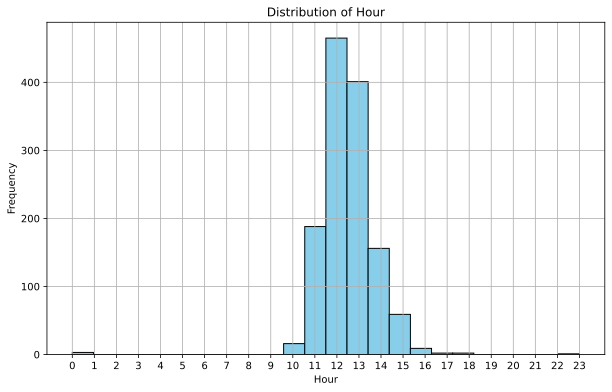

In [ ]:
import matplotlib.pyplot as plt

# Assuming your DataFrame is named results_gdf_w_green
import matplotlib.pyplot as plt

# Assuming your DataFrame is named results_gdf_w_green

# Plotting
plt.figure(figsize=(10, 6))
plt.hist(result_gdf_w_green['hour'], bins=24, color='skyblue', edgecolor='black')
plt.title('Distribution of Hour')
plt.xlabel('Hour')
plt.ylabel('Frequency')
plt.xticks(range(24))  # Ensure ticks for each hour
plt.grid(True)
plt.show()

# # Plotting
# plt.figure(figsize=(10, 6))
# plt.scatter(result_gdf_w_green['hour'], result_gdf_w_green['Traffic'], alpha=0.1)
# plt.title('Hour vs ISOPleasant')
# plt.xlabel('Hour')
# plt.ylabel('ISOPleasant')
# plt.grid(True)
# plt.show()


In [ ]:
resultgdf_gr_hour = result_gdf_w_green.groupby(['hour', 'LocationID'])
# resultgdf_gr_hour = resultgdf_gr_hour[filters_for_df]
print(resultgdf_gr_hour)

mean_values_hour = resultgdf_gr_hour.mean()
# median_values = grouped_data.median()
# mode_values = grouped_data.apply(lambda x: x.mode().iloc[0] if len(x.mode()) > 0 else None)


# # Display the results
# print("Mean Values:")
mean_values_hour.round(3)

<ipython-input-71-5f3890116efd>:5: FutureWarning: The default value of numeric_only in DataFrameGroupBy.mean is deprecated. In a future version, numeric_only will default to False. Either specify numeric_only or select only columns which should be valid for the function.
  mean_values_hour = resultgdf_gr_hour.mean()


RecordID  Lockdown  latitude  longitude  Traffic  \
hour LocationID                                                            
0    CamdenTown          567.500       0.0    51.539     -0.143    4.000   
     RegentsParkJapan    524.000       0.0    51.527     -0.153    2.000   
10   RegentsParkFields   798.778       0.0    51.531     -0.142    2.667   
     TateModern          761.857       0.0    51.508     -0.100    2.571   
11   CamdenTown          565.929       0.0    51.539     -0.143    3.643   
...                          ...       ...       ...        ...      ...   
16   SanMarco            102.333       0.0    45.434     12.340    1.222   
17   TateModern          714.000       0.0    51.508     -0.100    3.500   
18   TateModern          732.000       0.0    51.508     -0.100    2.000   
     TorringtonSq       1283.000       0.0    51.523     -0.131    4.000   
23   TateModern          766.000       0.0    51.508     -0.100    2.000   

                        Other  Human  Natural  ISOPleasant  ISOEventful  ...  \
hour LocationID                                                          ...   
0    CamdenTown         3.500  4.000    2.000        0.186        0.405  ...   
     RegentsParkJapan   3.000  2.000    4.000        1.000        0.207  ...   
10   RegentsParkFields  2.222  3.556    2.889        0.614       -0.071  ...   
     TateModern         2.000  3.000    2.000        0.423       -0.071  ...   
11   CamdenTown         2.571  3.500    1.286       -0.068        0.336  ...   
...                       ...    ...      ...          ...          ...  ...   
16   SanMarco           2.222  4.556    2.111        0.268        0.329  ...   
17   TateModern         2.500  4.000    2.500        0.338        0.494  ...   
18   TateModern         2.000  5.000    4.000        0.927        0.030  ...   
     TorringtonSq       2.000  4.000    4.000        0.384        0.927  ...   
23   TateModern         1.000  4.000    1.000        0.427        0.177  ...   

                        RA_2D_cp(cPa)  PA(Zwicker)    dataID  outlier  \
hour LocationID                                                         
0    CamdenTown                15.100       33.314    41.500    0.000   
     RegentsParkJapan           9.900       10.011   647.000    0.000   
10   RegentsParkFields         11.438       11.044   443.556    0.556   
     TateModern                12.933       13.922  1138.714    0.714   
11   CamdenTown                14.344       51.157    22.357    0.000   
...                               ...          ...       ...      ...   
16   SanMarco                  15.833       49.383   891.000    0.000   
17   TateModern                13.350       20.723  1107.000    0.500   
18   TateModern                   NaN          NaN  1120.000    0.000   
     TorringtonSq              13.400       23.245  1284.000    1.000   
23   TateModern                   NaN          NaN  1186.000    1.000   

                        dist_to_road  nrt_category  bdist_to_road  dist_veg  \
hour LocationID                                                               
0    CamdenTown                  0.0         1.000          0.000     0.000   
     RegentsParkJapan            0.0         5.500          0.013     0.000   
10   RegentsParkFields           0.0         2.167          0.003     0.003   
     TateModern                  0.0         1.571          0.014     0.000   
11   CamdenTown                  0.0         1.000          0.000     0.000   
...                              ...           ...            ...       ...   
16   SanMarco                    0.0         5.500         13.892     0.001   
17   TateModern                  0.0         2.750          0.025     0.000   
18   TateModern                  0.0         5.500          0.049     0.000   
     TorringtonSq                0.0         0.000          0.000     0.000   
23   TateModern                  0.0         0.000          0.000     0.000   

                

/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


<Figure size 1200x1000 with 0 Axes>

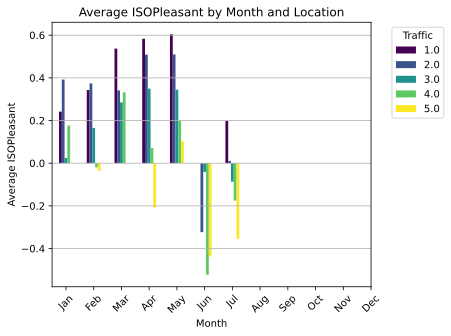

In [ ]:
import matplotlib.pyplot as plt

# Assuming your DataFrame is named results_gdf_w_green

# Extract month from 'start_time'
result_gdf_w_green['month'] = result_gdf_w_green['start_time'].dt.month

# Group by month and LocationID, then calculate the average ISOPleasant
group_thing = 'Traffic'
monthly_location_avg_ISOPleasant = result_gdf_w_green.groupby(['month', group_thing])['ISOPleasant'].mean().unstack()

# Plotting
plt.figure(figsize=(12, 10))
monthly_location_avg_ISOPleasant.plot(kind='bar', colormap='viridis', edgecolor= None)
plt.title('Average ISOPleasant by Month and Location')
plt.xlabel('Month')
plt.ylabel('Average ISOPleasant')
plt.xticks(range(0, 12), ['Jan', 'Feb', 'Mar', 'Apr', 'May', 'Jun', 'Jul', 'Aug', 'Sep', 'Oct', 'Nov', 'Dec'], rotation=45)
plt.legend(title= group_thing, bbox_to_anchor=(1.05, 1), loc='upper left')
plt.grid(axis='y')
plt.tight_layout()
plt.show()


# SEM

In [ ]:
# import semopy

# data = semopy.examples.political_democracy.get_data()
# mod = semopy.examples.political_democracy.get_model()
# m = semopy.Model(mod)
# m.fit(data)
# # g = semopy.semplot(m, "pd.png")

#how many ISOPleasant outcomes are there

In [ ]:
import pandas as pd
from math import cos
from itertools import product

# Define lists for variables
pleasant = list(range(1, 6))
annoying = list(range(1, 6))
calm = list(range(1, 6))
chaotic = list(range(1, 6))
vibrant = list(range(1, 6))
monotonous = list(range(1, 6))

# Generate all possible combinations of variables
combinations = product(pleasant, annoying, calm, chaotic, vibrant, monotonous)

# Initialize lists to store combinations and ISO_Pleasant001 values
data = []

# Calculate ISO_Pleasant001 for each combination of variables
for idx, (p, a, c, ch, v, m) in enumerate(combinations, start=1):
    data.append([idx, p, a, c, ch, v, m])

# Create a DataFrame
sample_transform = pd.DataFrame(data, columns=['RecordID', 'pleasant', 'annoying', 'calm', 'chaotic', 'vibrant', 'monotonous'])
sample_transform['eventful'] = 0
sample_transform['uneventful'] = 0



sample_transform = sspy.surveys.convert_column_to_index(sample_transform, 'RecordID')
sample_transform = sspy.surveys.rename_paqs(sample_transform)
sample_transform = sspy.surveys.add_iso_coords(sample_transform)
sample_transform

unique_values = sample_transform['ISOPleasant'].unique()
print(len(unique_values))
# print(max(unique_values))

255


In [ ]:
unique_values
print(len(sample_transform))
# myset = set(unique_values)
# print(unique_values)


15625


/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


In [ ]:
sample_transform

,RecordID,PAQ1,PAQ5,PAQ8,PAQ4,PAQ2,PAQ6,PAQ3,PAQ7,ISOPleasant,ISOEventful
RecordID,,,,,,,,,,,
1,1,1,1,1,1,1,1,0,0,0.000000,0.000000
2,2,1,1,1,1,1,2,0,0,-0.073223,-0.073223
3,3,1,1,1,1,1,3,0,0,-0.146447,-0.146447
4,4,1,1,1,1,1,4,0,0,-0.219670,-0.219670
5,5,1,1,1,1,1,5,0,0,-0.292893,-0.292893
...,...,...,...,...,...,...,...,...,...,...,...
15621,15621,5,5,5,5,5,1,0,0,0.292893,0.292893
15622,15622,5,5,5,5,5,2,0,0,0.219670,0.219670
15623,15623,5,5,5,5,5,3,0,0,0.146447,0.146447


/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


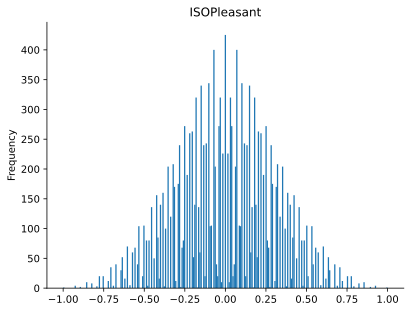

In [ ]:
from matplotlib import pyplot as plt
sample_transform['ISOPleasant'].plot(kind='hist', bins=255, title='ISOPleasant')
plt.gca().spines[['top', 'right',]].set_visible(False)

# machine learning

In [ ]:
import pandas as pd
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler

# Extract predictor variables and target variable
predictors = result_gdf_w_green[['dist_to_road', 'dist_veg']]
target = result_gdf_w_green['ISOPleasant']

# Split data into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(predictors, target, test_size=0.2, random_state=42)

# Standardize predictor variables
scaler = StandardScaler()
X_train_scaled = scaler.fit_transform(X_train)
X_test_scaled = scaler.transform(X_test)


/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


In [ ]:
from keras.models import Sequential
from keras.layers import Dense

# Define the model
model = Sequential()

# Add dense layers
model.add(Dense(64, activation='relu', input_shape=(2,)))  # 2 input features
model.add(Dense(32, activation='relu'))
model.add(Dense(1, activation='sigmoid'))  # Output layer for binary classification

# Compile the model
model.compile(loss='binary_crossentropy', optimizer='adam', metrics=['accuracy'])

# Display the model summary
model.summary()



/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)
<frozen importlib._bootstrap>:914: ImportWarning: _PyDrive2ImportHook.find_spec() not found; falling back to find_module()
<frozen importlib._bootstrap>:914: ImportWarning: _PyDriveImportHook.find_spec() not found; falling back to find_module()
<frozen importlib._bootstrap>:914: ImportWarning: _GenerativeAIImportHook.find_spec() not found; falling back to find_module()
<frozen importlib._bootstrap>:914: ImportWarning: _OpenCVImportHook.find_spec() not found; falling back to find_module()
<frozen importlib._bootstrap>:914: ImportWarning: APICoreClientInfoImportHook.find_spec() not found; falling back to find_module()
<frozen importlib._bo

Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense (Dense)               (None, 64)                192       
                                                                 
 dense_1 (Dense)             (None, 32)                2080      
                                                                 
 dense_2 (Dense)             (None, 1)                 33        
                                                                 
Total params: 2305 (9.00 KB)
Trainable params: 2305 (9.00 KB)
Non-trainable params: 0 (0.00 Byte)
_________________________________________________________________
